# BIG DATA & MARKETING: GOOGLE TRENDS TIME SERIES PROJECT

Cruz, Juan Esteban

Mai, Thu Ha

Cerra, Mariana Montserrat

# 1. Introduction

**Context** 

Given that 70% of luxury purchases are estimated to be influenced by online interactions (D’Arpizio and Levato 2017), Google Trends could be essential in the growth of big data in the luxury industry. Consumers of luxury items are actively using Google to get inspiration, select the best designs, and make purchases with a single tap (Boone 2016).Google alone processed 20 petabytes of data per day and received more than 4 million search inquiries every minute from 2.4 billion internet users (Wedel and Kannan 2016). Google can identify the next major luxury trend using data analytics on this kind of online behaviour (Bain, 2016).

This Jupyter Notebook, therefore, illustrates the use of Google Trends data to extract brand search volume, either to assess advertising or predict sales. The choice of different LVMH brands as the data set of interest for this study was influenced by several factors which were described in details in the attached report.

**Outline**

- Section 2 introduces the overall process of data collection

- Section 3 then focuses on outliers detection and treatment

- Section 4 concentrates entirely on clustering techniques, algorithms and results

- Section 5 is dedicated to the forecast application for each series and clustering

# 2. Dataset

**Desired dataset**

The dataset needed for the analysis contains the Google Trends Interest Over Time of:

- Different brands of LVMH

- Various categories/ business groups: perfumes & cosmetics, fashion & leather goods and wines & spirits

    - Perfumes & Cosmetics: 'Sephora', 'Make Up For Ever', 'Benefit Cosmetics', 'Fenty Beauty', 'Guerlain'
    - Fashion & Leather goods: 'Louis Vuitton', 'Christian Dior, S. A.', 'Givenchy', 'Marc Jacobs', 'Kenzo', 'Loewe', 'Fendi', 'Celine'
    - Wines & Spirits: 'Dom Pérignon', 'Veuve Clicquot Ponsardin', 'Chandon', 'Ruinart', 'Château Cheval Blanc', 'Hennessy', 'Moët & Chandon'
    
- In different countries: USA, France, Japan - three most prominent markets of LVMH worldwide

- In a timeframe of 5 years from 27th November 2017 to 27th November 2022

## 2.1 Data Collection

In [1]:
pip install pytrends

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import pytrends
from pytrends.request import TrendReq
pytrend = TrendReq()

In [3]:
# Source: https://towardsdatascience.com/a-very-precise-fast-way-to-pull-google-trends-data-automatically-4c3c431960aa
# Get exact keywords
KEYWORDS = ['Sephora', 'Make Up For Ever', 'Benefit Cosmetics', 'Fenty Beauty', 'Guerlain',
          'Louis Vuitton', 'Christian Dior, S. A.', 'Givenchy', 'Marc Jacobs', 'Kenzo','Loewe', 'Fendi', 'Celine',
          'Dom Pérignon', 'Veuve Clicquot Ponsardin', 'Chandon', 'Ruinart', 'Château Cheval Blanc', 'Hennessy', 'Moët & Chandon'] 
KEYWORDS_CODES = [pytrend.suggestions(keyword=i)[0] for i in KEYWORDS]
df_CODES = pd.DataFrame(KEYWORDS_CODES)
df_CODES

,mid,title,type
0,/m/05nn45,Sephora,Retail
1,/g/1ywtjp667,MAKE UP FOR EVER,Topic
2,/m/0cmwj9,Benefit Cosmetics,Cosmetics company
3,/g/11f53qtprn,Fenty Beauty,Topic
4,/m/0_w4m7v,Guerlain,Topic
5,/m/03h90x,Louis Vuitton,Fashion company
6,/m/04s4g6,Dior,Fashion company
7,/m/0hgt7_w,Givenchy,Fashion label
8,/m/063xvrw,Marc Jacobs,Fashion label
9,/m/0x20kx_,Kenzo S.A.,Fashion company


In [4]:
# Define parameters to meet our demand explained above
EXACT_KEYWORDS = df_CODES['mid'].to_list()
DATE_INTERVAL = '2017-11-27 2022-11-27'
COUNTRY = ["US", "FR", "JP"] 
CATEGORY = 0 # Since we have three different categories
SEARCH_TYPE = '' # Default is 'web searches'

In [19]:
# Get brand search volume in 03 countries
Individual_EXACT_KEYWORD = list(zip(*[iter(EXACT_KEYWORDS)]*1))
Individual_EXACT_KEYWORD = [list(x) for x in Individual_EXACT_KEYWORD]
dicti = {}
i = 1
for Country in COUNTRY:
    for keyword in Individual_EXACT_KEYWORD:
        pytrend.build_payload(kw_list=keyword, 
                              timeframe = DATE_INTERVAL, 
                              geo = Country, 
                              cat=CATEGORY,
                              gprop=SEARCH_TYPE) 
        dicti[i] = pytrend.interest_over_time()
        i+=1
df_trends = pd.concat(dicti, axis=1)

In [21]:
# Drop outside header
df_trends.columns = df_trends.columns.droplevel(0)

In [22]:
# Drop "isPartial"
df_trends = df_trends.drop('isPartial', axis = 1)

In [24]:
# Reset index
df_trends.reset_index(level=0, inplace=True)

In [26]:
# Change column names
df_trends.columns = ['date','Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US', 
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US', 
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US', 
                   'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR', 
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR', 
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR', 
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR', 
                   'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP', 
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP', 
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP', 
                   'Moët & Chandon-JP']

In [28]:
# Convert weekly to monthly data
df_trends.set_index('date', inplace=True)
df_trends = df_trends.resample('m').mean()

In [29]:
df_trends

,Sephora-US,Make Up For Ever-US,Benefit Cosmetics-US,Fenty Beauty-US,Guerlain-US,Louis Vuitton-US,Christian Dior-US,Givenchy-US,Marc Jacobs-US,Kenzo-US,...,Loewe-JP,Fendi-JP,Celine-JP,Dom Pérignon-JP,Veuve Clicquot-JP,Chandon-JP,Ruinart-JP,Château Cheval Blanc-JP,Hennessy-JP,Moët & Chandon-JP
date,,,,,,,,,,,,,,,,,,,,,
2017-12-31,75.60,81.600000,80.200000,76.60,80.200000,69.000000,20.400000,51.200000,39.00,38.40,...,8.60,49.800000,32.400000,73.20,54.600000,17.60,16.800000,34.80,50.000000,65.80
2018-01-31,46.25,67.250000,79.500000,45.75,67.750000,51.500000,15.250000,40.250000,22.00,33.00,...,8.75,47.000000,32.250000,59.00,33.500000,5.75,5.000000,5.00,45.500000,38.25
2018-02-28,43.75,71.750000,75.750000,36.75,72.250000,52.000000,16.250000,42.250000,26.50,33.25,...,7.50,36.750000,28.000000,44.75,28.750000,19.25,32.250000,8.25,48.250000,39.00
2018-03-31,43.25,63.750000,77.750000,38.00,69.250000,49.000000,15.750000,54.000000,22.75,54.50,...,8.00,34.500000,26.250000,44.25,32.250000,0.00,21.250000,10.50,44.250000,39.25
2018-04-30,50.00,69.200000,71.600000,45.00,67.800000,48.400000,16.400000,37.800000,27.60,36.40,...,7.00,34.400000,26.000000,41.60,29.400000,6.60,31.000000,6.40,50.200000,33.60
2018-05-31,41.00,57.750000,66.250000,48.50,65.500000,49.500000,17.250000,49.500000,25.50,32.00,...,7.75,34.750000,25.250000,45.75,29.750000,12.50,30.500000,0.00,49.250000,35.00
2018-06-30,41.00,51.500000,67.250000,34.25,58.500000,48.250000,17.250000,42.000000,22.75,30.50,...,7.50,37.000000,28.000000,38.00,33.750000,0.00,15.250000,12.25,56.750000,40.00
2018-07-31,41.40,57.200000,69.400000,33.40,55.000000,49.200000,16.600000,40.600000,22.00,31.60,...,6.40,36.400000,24.000000,37.60,27.200000,0.00,4.600000,15.60,40.200000,38.60
2018-08-31,44.75,57.250000,75.750000,24.75,62.000000,48.500000,16.500000,37.250000,21.75,29.00,...,8.00,43.250000,27.750000,38.75,30.500000,0.00,5.750000,14.25,55.500000,35.00


In [30]:
# Reset index
df_trends.reset_index(level=0, inplace=True)

In [31]:
# Save as csv
df_trends.to_csv(r'/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/database_TS1.csv', index=False)

In [5]:
# Import csv file for reproducible results
all_trends = pd.read_csv(r'/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/database_TS1.csv')
all_trends

,date,Sephora-US,Make Up For Ever-US,Benefit Cosmetics-US,Fenty Beauty-US,Guerlain-US,Louis Vuitton-US,Christian Dior-US,Givenchy-US,Marc Jacobs-US,...,Loewe-JP,Fendi-JP,Celine-JP,Dom Pérignon-JP,Veuve Clicquot-JP,Chandon-JP,Ruinart-JP,Château Cheval Blanc-JP,Hennessy-JP,Moët & Chandon-JP
0,2017-12-31,75.60,81.600000,80.200000,76.60,80.200000,69.000000,20.400000,51.200000,39.00,...,8.60,49.800000,32.400000,73.20,54.600000,17.60,16.800000,34.80,50.000000,65.80
1,2018-01-31,46.25,67.250000,79.500000,45.75,67.750000,51.500000,15.250000,40.250000,22.00,...,8.75,47.000000,32.250000,59.00,33.500000,5.75,5.000000,5.00,45.500000,38.25
2,2018-02-28,43.75,71.750000,75.750000,36.75,72.250000,52.000000,16.250000,42.250000,26.50,...,7.50,36.750000,28.000000,44.75,28.750000,19.25,32.250000,8.25,48.250000,39.00
3,2018-03-31,43.25,63.750000,77.750000,38.00,69.250000,49.000000,15.750000,54.000000,22.75,...,8.00,34.500000,26.250000,44.25,32.250000,0.00,21.250000,10.50,44.250000,39.25
4,2018-04-30,50.00,69.200000,71.600000,45.00,67.800000,48.400000,16.400000,37.800000,27.60,...,7.00,34.400000,26.000000,41.60,29.400000,6.60,31.000000,6.40,50.200000,33.60
5,2018-05-31,41.00,57.750000,66.250000,48.50,65.500000,49.500000,17.250000,49.500000,25.50,...,7.75,34.750000,25.250000,45.75,29.750000,12.50,30.500000,0.00,49.250000,35.00
6,2018-06-30,41.00,51.500000,67.250000,34.25,58.500000,48.250000,17.250000,42.000000,22.75,...,7.50,37.000000,28.000000,38.00,33.750000,0.00,15.250000,12.25,56.750000,40.00
7,2018-07-31,41.40,57.200000,69.400000,33.40,55.000000,49.200000,16.600000,40.600000,22.00,...,6.40,36.400000,24.000000,37.60,27.200000,0.00,4.600000,15.60,40.200000,38.60
8,2018-08-31,44.75,57.250000,75.750000,24.75,62.000000,48.500000,16.500000,37.250000,21.75,...,8.00,43.250000,27.750000,38.75,30.500000,0.00,5.750000,14.25,55.500000,35.00
9,2018-09-30,40.20,58.600000,68.200000,32.40,54.400000,42.000000,17.800000,36.200000,20.80,...,8.20,48.200000,39.200000,43.60,29.200000,20.00,5.400000,0.00,36.800000,32.60


## 2.2 Exploratory data analysis (EDA)
- Deal with missing values
- Check descriptive statistics
- Plot some time series for illustration purpose

In [6]:
print("In total: ", all_trends.shape)

In total:  (60, 61)


In [7]:
all_trends.describe()

,Sephora-US,Make Up For Ever-US,Benefit Cosmetics-US,Fenty Beauty-US,Guerlain-US,Louis Vuitton-US,Christian Dior-US,Givenchy-US,Marc Jacobs-US,Kenzo-US,...,Loewe-JP,Fendi-JP,Celine-JP,Dom Pérignon-JP,Veuve Clicquot-JP,Chandon-JP,Ruinart-JP,Château Cheval Blanc-JP,Hennessy-JP,Moët & Chandon-JP
count,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,...,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000
mean,40.316667,40.219722,57.493611,35.695833,65.269722,60.053056,35.729444,35.446111,34.710000,30.045833,...,20.012500,54.425278,41.613889,43.171667,33.771111,7.677500,13.144444,9.350833,42.435278,34.719167
std,10.239222,13.780801,12.691223,8.231879,7.795265,9.687431,16.994115,6.432365,17.859152,5.438643,...,12.082456,15.895526,16.013698,9.443069,12.480105,8.751322,8.470608,8.580770,9.210787,11.350137
min,27.000000,23.400000,42.400000,23.750000,51.600000,42.000000,15.250000,22.400000,14.800000,22.000000,...,6.400000,0.750000,5.250000,28.000000,6.750000,0.000000,0.000000,0.000000,10.000000,8.750000
25%,33.937500,27.900000,46.237500,30.312500,59.787500,52.375000,21.375000,30.787500,21.500000,27.000000,...,9.687500,48.150000,27.937500,37.712500,26.550000,0.000000,6.625000,2.700000,38.725000,28.937500
50%,38.700000,39.875000,51.100000,35.200000,64.750000,60.925000,34.825000,34.100000,26.250000,28.625000,...,16.300000,53.500000,39.225000,40.625000,31.125000,5.675000,12.200000,8.125000,42.100000,33.375000
75%,43.812500,45.375000,68.425000,38.000000,69.287500,65.250000,45.312500,37.912500,41.000000,33.000000,...,28.437500,63.387500,54.150000,44.637500,38.975000,10.312500,18.637500,12.850000,48.875000,37.500000
max,75.600000,81.600000,83.500000,76.600000,92.250000,90.500000,88.000000,54.000000,80.000000,54.500000,...,58.200000,93.750000,79.000000,73.200000,82.750000,44.000000,35.000000,34.800000,58.000000,69.200000


In [8]:
# Check missing values (There is no missing values)
all_trends.isnull().sum()

date                       0
Sephora-US                 0
Make Up For Ever-US        0
Benefit Cosmetics-US       0
Fenty Beauty-US            0
                          ..
Chandon-JP                 0
Ruinart-JP                 0
Château Cheval Blanc-JP    0
Hennessy-JP                0
Moët & Chandon-JP          0
Length: 61, dtype: int64

### Graphs

In [9]:
# Plot graph over time for the brand Louis Vuitton
import plotly.express as px
fig = px.line(all_trends, x="date", y=['Louis Vuitton-US', 'Louis Vuitton-FR','Louis Vuitton-JP'], 
              title='Keyword Web Search Interest Over Time')
fig.show()

In [10]:
# Plot graph over time for all the time series
fig = px.line(all_trends, x="date", y=['Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US', 
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US', 
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US', 
                   'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR', 
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR', 
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR', 
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR', 
                   'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP', 
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP', 
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP', 
                   'Moët & Chandon-JP'], 
              title='Keyword Web Search Interest Over Time')
fig.show() 

In [11]:
trends_US = all_trends[['date','Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US', 
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US', 
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US']]
trends_FR = all_trends[['date', 'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR', 
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR', 
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR', 
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR']]
trends_JP = all_trends[['date', 'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP', 
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP', 
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP', 
                   'Moët & Chandon-JP']]

In [12]:
corr_US = trends_US.corr()
corr_FR = trends_FR.corr()
corr_JP = trends_JP.corr()
corr_all = all_trends.corr()

In [13]:
# Plot correlations of trends per country
corr = [corr_US, corr_FR, corr_JP, corr_all]
corr[3]

,Sephora-US,Make Up For Ever-US,Benefit Cosmetics-US,Fenty Beauty-US,Guerlain-US,Louis Vuitton-US,Christian Dior-US,Givenchy-US,Marc Jacobs-US,Kenzo-US,...,Loewe-JP,Fendi-JP,Celine-JP,Dom Pérignon-JP,Veuve Clicquot-JP,Chandon-JP,Ruinart-JP,Château Cheval Blanc-JP,Hennessy-JP,Moët & Chandon-JP
Sephora-US,1.000000,0.599197,0.617192,0.533427,0.569570,0.085007,-0.145939,0.685219,0.156224,0.329189,...,-0.166297,0.143922,-0.096039,0.695880,0.261566,0.300875,0.124139,0.202652,0.314467,0.645045
Make Up For Ever-US,0.599197,1.000000,0.796896,0.464169,0.155459,-0.503996,-0.558211,0.603203,-0.173628,0.438612,...,-0.556472,-0.385827,-0.442826,0.357892,0.026140,0.311422,0.266249,0.144137,0.197252,0.290042
Benefit Cosmetics-US,0.617192,0.796896,1.000000,0.246123,0.095526,-0.395832,-0.717754,0.546958,-0.440718,0.395650,...,-0.719602,-0.339998,-0.656884,0.473408,-0.180693,0.436845,0.184215,0.083973,-0.030831,0.273453
Fenty Beauty-US,0.533427,0.464169,0.246123,1.000000,0.370775,0.144008,-0.041760,0.513848,0.166305,0.315707,...,-0.053203,-0.017235,0.000543,0.453468,0.283799,0.131186,0.336930,0.165908,0.145961,0.402443
Guerlain-US,0.569570,0.155459,0.095526,0.370775,1.000000,0.544469,0.420073,0.580192,0.584346,0.205091,...,0.426051,0.402160,0.435330,0.529874,0.455577,0.022043,0.179491,0.192802,0.334764,0.537945
Louis Vuitton-US,0.085007,-0.503996,-0.395832,0.144008,0.544469,1.000000,0.653508,0.137597,0.447437,0.027199,...,0.645392,0.629028,0.585208,0.314599,0.392511,-0.148997,-0.111033,0.146117,0.099292,0.380552
Christian Dior-US,-0.145939,-0.558211,-0.717754,-0.041760,0.420073,0.653508,1.000000,-0.072571,0.865720,-0.193734,...,0.950102,0.548377,0.898289,-0.118150,0.576268,-0.319220,-0.199764,0.008376,0.227215,0.132162
Givenchy-US,0.685219,0.603203,0.546958,0.513848,0.580192,0.137597,-0.072571,1.000000,0.188992,0.618791,...,-0.042952,0.116705,0.013129,0.637534,0.352396,0.160227,0.249458,0.199416,0.337352,0.669967
Marc Jacobs-US,0.156224,-0.173628,-0.440718,0.166305,0.584346,0.447437,0.865720,0.188992,1.000000,-0.104681,...,0.810369,0.412302,0.822440,0.028605,0.679197,-0.211506,-0.063001,0.026684,0.393433,0.296134
Kenzo-US,0.329189,0.438612,0.395650,0.315707,0.205091,0.027199,-0.193734,0.618791,-0.104681,1.000000,...,-0.162809,-0.054097,-0.148506,0.337615,0.102012,0.037439,0.134499,0.054905,-0.001918,0.293198


/var/folders/ck/mkn3qyf97rj2rq0gb3jshzb80000gn/T/ipykernel_22648/89626120.py:3: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



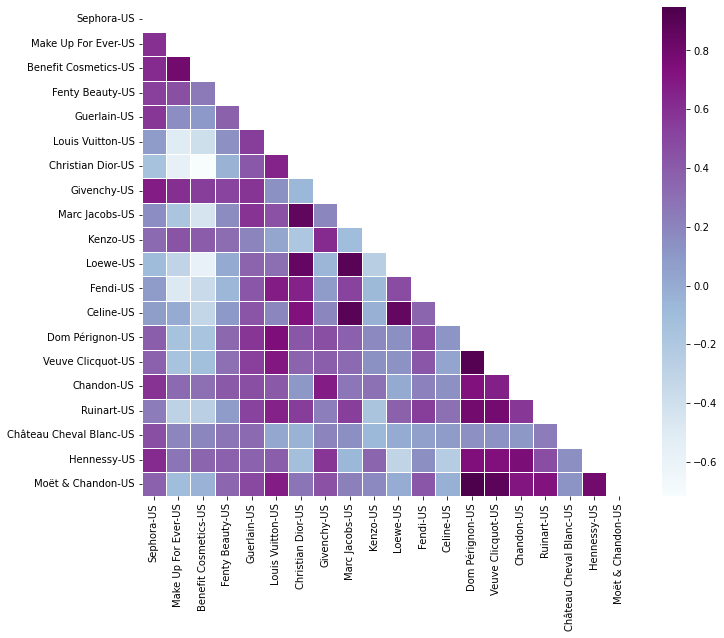

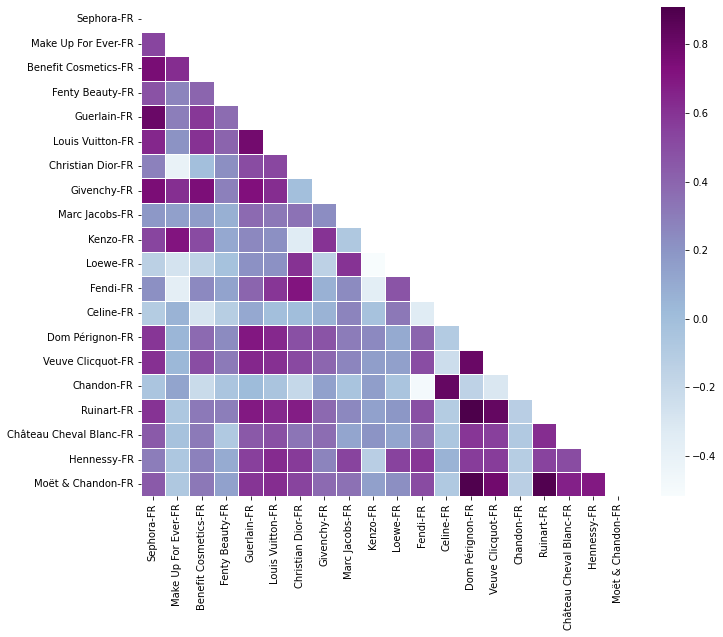

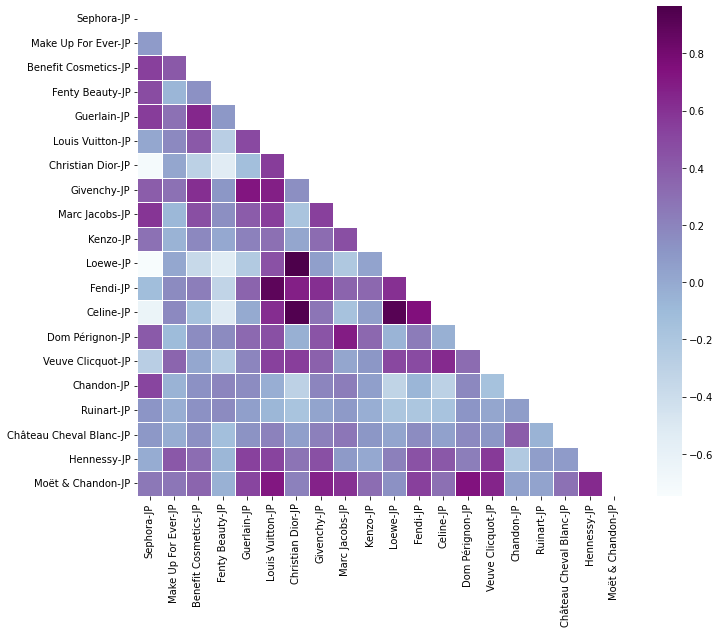

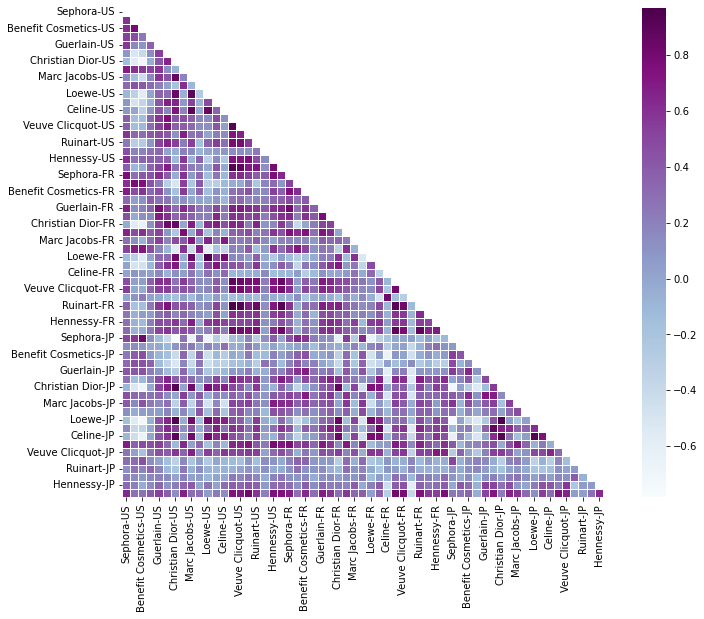

In [14]:
for i in corr:
    # Generate a mask for the upper triangle
    mask = np.zeros_like(i, dtype = np.bool)
    mask[np.triu_indices_from(mask)] = True
    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize = (11, 9))
    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(i, mask = mask,
                square = True, linewidths = .5, ax = ax, cmap = "BuPu")      
    plt.show()  

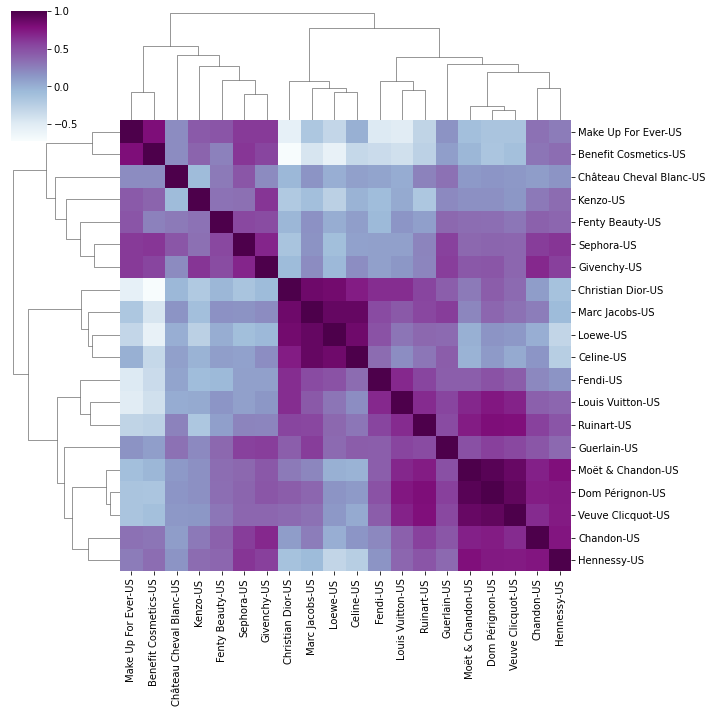

In [15]:
# Clustermap for the US
sns.clustermap(corr_US,
               row_cluster=True,   
               col_cluster=True,
               figsize=(10, 10), cmap = "BuPu") 

# 3. Dealing with outliers
- Necessary to identify the outliers and deal with these observations as they are values that can generate noise in the identification of clusters and even more in forecasting the time trends we are using.
- We use the library Kats, a toolkit created by Facebook’s Infrastructure Data Science team to analyze time series quickly.

In [16]:
pip install kats

Note: you may need to restart the kernel to use updated packages.


## 3.1 Removing outliers for US trends

In [17]:
# REMOVING OUTLIERS FOR US TRENDS
trends_US.columns = ['time', 'Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US', 
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US', 
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US']
trends_US.head()

,time,Sephora-US,Make Up For Ever-US,Benefit Cosmetics-US,Fenty Beauty-US,Guerlain-US,Louis Vuitton-US,Christian Dior-US,Givenchy-US,Marc Jacobs-US,...,Loewe-US,Fendi-US,Celine-US,Dom Pérignon-US,Veuve Clicquot-US,Chandon-US,Ruinart-US,Château Cheval Blanc-US,Hennessy-US,Moët & Chandon-US
0,2017-12-31,75.60,81.60,80.20,76.60,80.20,69.0,20.40,51.20,39.00,...,17.20,48.20,56.2,40.4,36.4,67.80,27.00,33.60,74.80,36.20
1,2018-01-31,46.25,67.25,79.50,45.75,67.75,51.5,15.25,40.25,22.00,...,16.75,37.75,58.5,18.5,18.0,34.25,5.25,14.75,55.50,21.75
2,2018-02-28,43.75,71.75,75.75,36.75,72.25,52.0,16.25,42.25,26.50,...,18.00,45.50,52.0,17.0,14.5,40.50,7.25,25.25,49.00,16.00
3,2018-03-31,43.25,63.75,77.75,38.00,69.25,49.0,15.75,54.00,22.75,...,18.75,40.25,54.0,16.5,18.0,37.00,7.25,10.00,49.75,15.50
4,2018-04-30,50.00,69.20,71.60,45.00,67.80,48.4,16.40,37.80,27.60,...,20.00,52.20,54.2,16.2,18.0,37.00,15.00,21.60,52.60,14.80


In [18]:
from kats.consts import TimeSeriesData

# Transform the outlier data into `TimeSeriesData` Object
trends_US_ts = TimeSeriesData(trends_US) 

In [19]:
# Plot the time series for Christian Dior-US, to see it before removing the outliers
fig = px.line(all_trends, x="date", y=['Christian Dior-US'], 
              title='Keyword Web Search Interest Over Time')
fig.show()

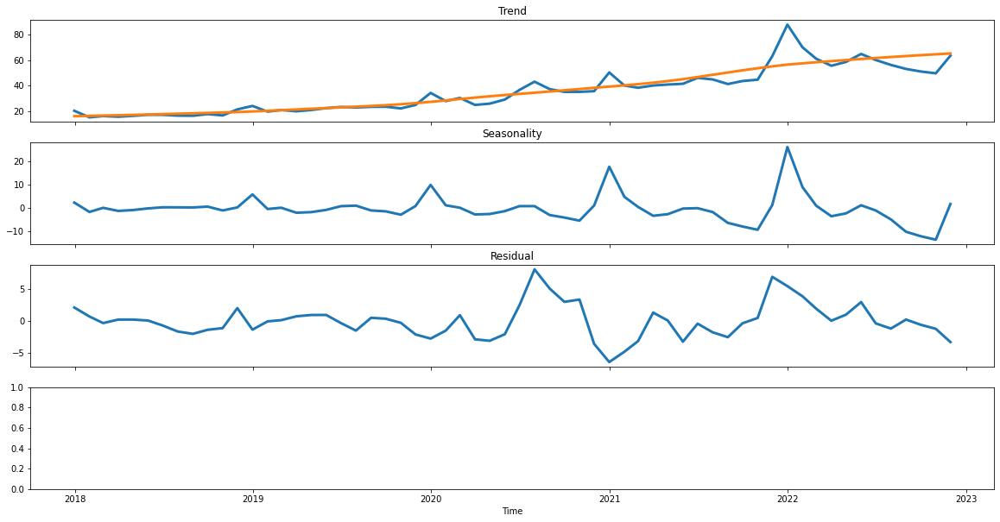

In [20]:
# TimeSeriesDecomposition provides utilities to decompose an input time series
from kats.utils.decomposition import TimeSeriesDecomposition

ts = trends_US_ts['Christian Dior-US']
decomposer = TimeSeriesDecomposition(ts, decomposition="additive")
results = decomposer.decomposer()
fig = decomposer.plot()

In [21]:
# Source: https://github.com/facebookresearch/Kats/blob/main/tutorials/kats_101_basics.ipynb
from kats.detectors.outlier import OutlierDetector

ts_outlierDetection = OutlierDetector(trends_US_ts, 'additive') # call OutlierDetector
ts_outlierDetection.detector() # apply OutlierDetector

In [22]:
# These are the outliers for the trend 'Christian Dior-US' (we can show the outliers of each trend)
ts_outlierDetection.outliers[6]   # 6 because that is the column for Christian Dior

[Timestamp('2021-12-31 00:00:00'),
 Timestamp('2022-08-31 00:00:00'),
 Timestamp('2022-09-30 00:00:00'),
 Timestamp('2022-10-31 00:00:00')]

In [23]:
trends_US_ts_outliers_removed = ts_outlierDetection.remover(interpolate = False) # No interpolation, just with the outlier removed
trends_US_ts_outliers_interpolated = ts_outlierDetection.remover(interpolate = True) # With interpolation

In [24]:
trends_US_ts_outliers_removed 

,time,y_0,y_1,y_2,y_3,y_4,y_5,y_6,y_7,y_8,...,y_10,y_11,y_12,y_13,y_14,y_15,y_16,y_17,y_18,y_19
0,2017-12-31,75.60,81.600000,80.200000,NaN,80.200000,69.000000,20.400000,51.200000,39.00,...,17.200000,48.20,56.20,40.400000,36.400000,67.80,27.00,33.60,74.80,36.20
1,2018-01-31,46.25,67.250000,79.500000,45.75,67.750000,51.500000,15.250000,40.250000,22.00,...,16.750000,37.75,58.50,18.500000,18.000000,34.25,5.25,14.75,55.50,21.75
2,2018-02-28,43.75,71.750000,75.750000,36.75,72.250000,52.000000,16.250000,42.250000,26.50,...,18.000000,45.50,52.00,17.000000,14.500000,40.50,7.25,25.25,49.00,16.00
3,2018-03-31,43.25,63.750000,77.750000,38.00,69.250000,49.000000,15.750000,54.000000,22.75,...,18.750000,40.25,54.00,16.500000,18.000000,37.00,7.25,10.00,49.75,15.50
4,2018-04-30,50.00,69.200000,71.600000,45.00,67.800000,48.400000,16.400000,37.800000,27.60,...,20.000000,52.20,54.20,16.200000,18.000000,37.00,15.00,21.60,52.60,14.80
5,2018-05-31,41.00,57.750000,66.250000,48.50,65.500000,49.500000,17.250000,49.500000,25.50,...,18.250000,55.75,54.00,20.500000,13.250000,37.50,14.25,25.00,54.75,16.50
6,2018-06-30,41.00,51.500000,67.250000,34.25,58.500000,48.250000,17.250000,42.000000,22.75,...,18.500000,47.25,49.75,19.000000,13.250000,40.50,7.00,8.75,56.00,20.50
7,2018-07-31,41.40,57.200000,69.400000,33.40,55.000000,49.200000,16.600000,40.600000,22.00,...,19.800000,51.60,52.80,19.200000,16.800000,39.80,15.40,11.40,56.60,16.20
8,2018-08-31,44.75,57.250000,75.750000,24.75,62.000000,48.500000,16.500000,37.250000,21.75,...,18.500000,53.00,53.75,17.500000,15.750000,33.75,18.50,19.00,52.50,14.25
9,2018-09-30,40.20,58.600000,68.200000,32.40,54.400000,42.000000,17.800000,36.200000,20.80,...,18.800000,53.00,NaN,16.400000,12.600000,33.80,16.40,23.40,52.80,17.40


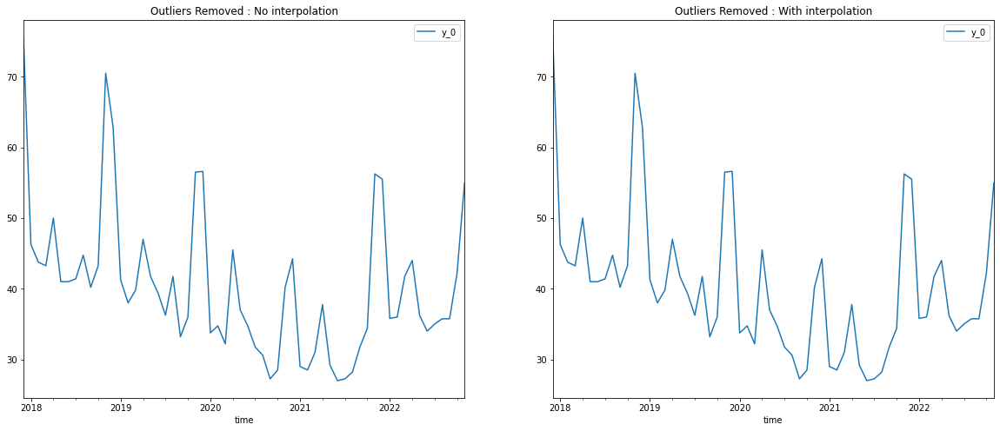

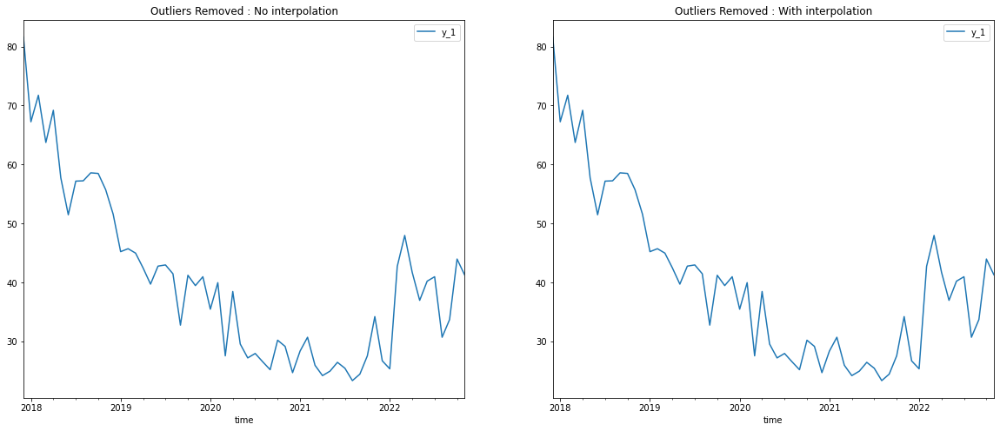

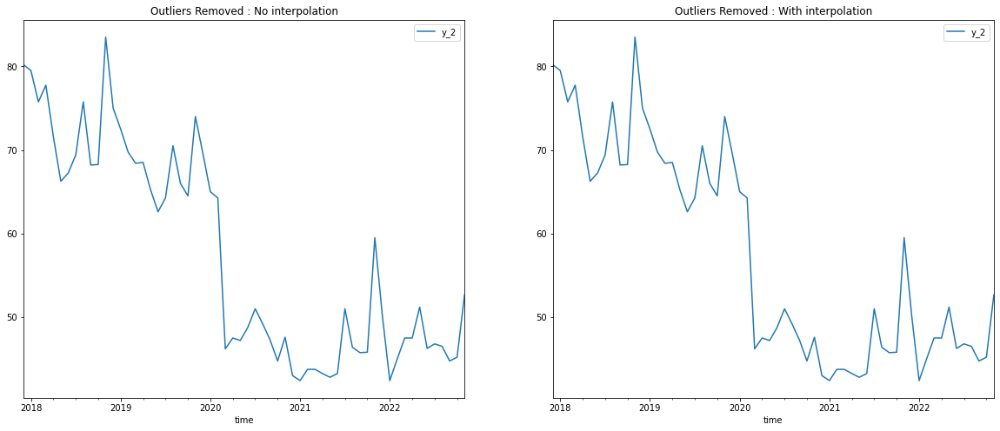

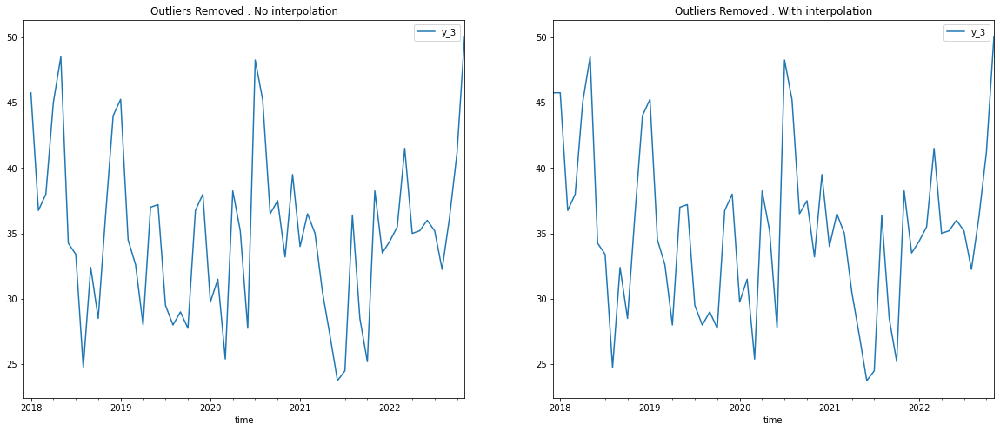

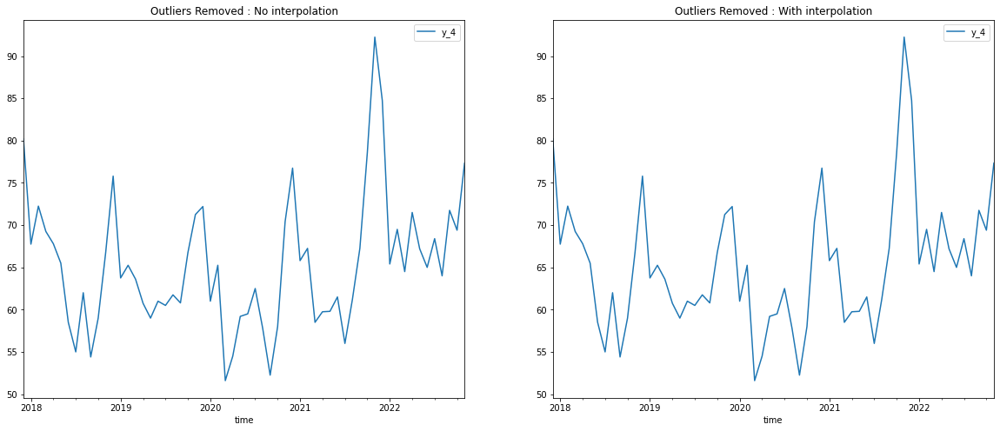

...

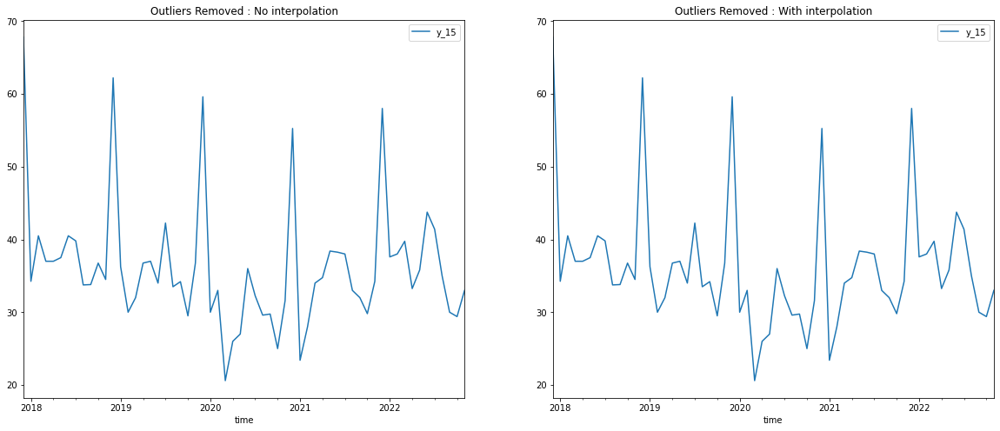

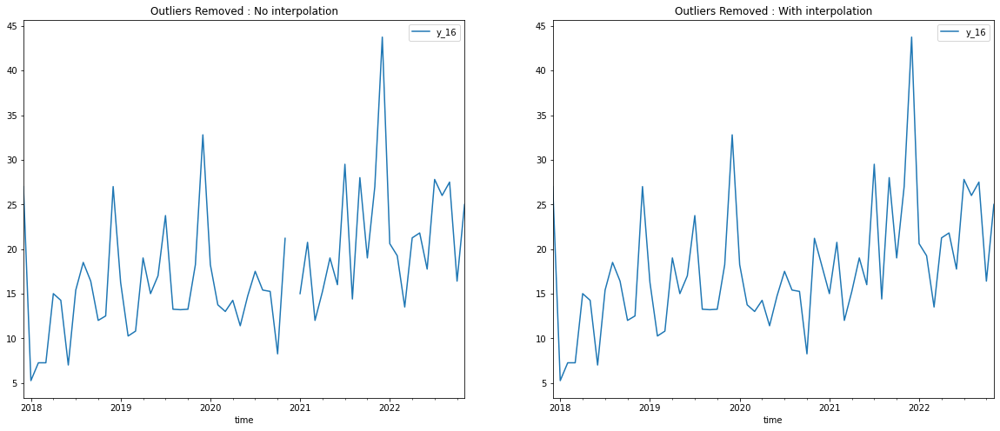

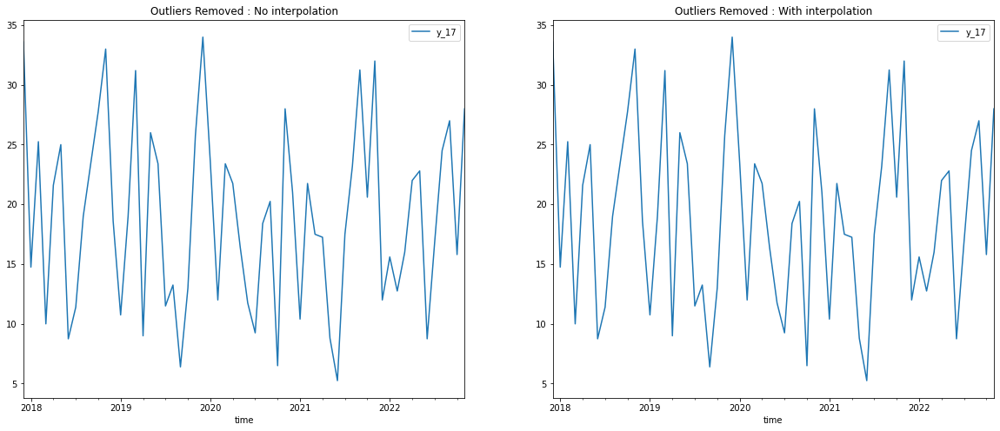

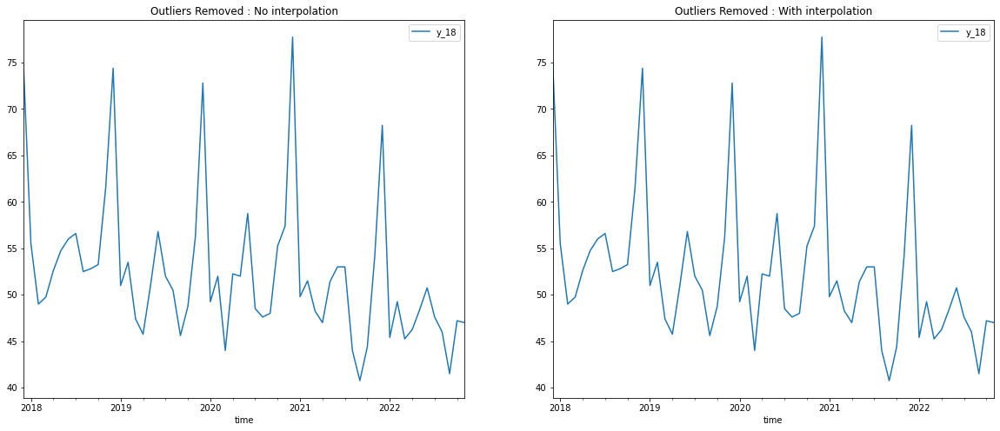

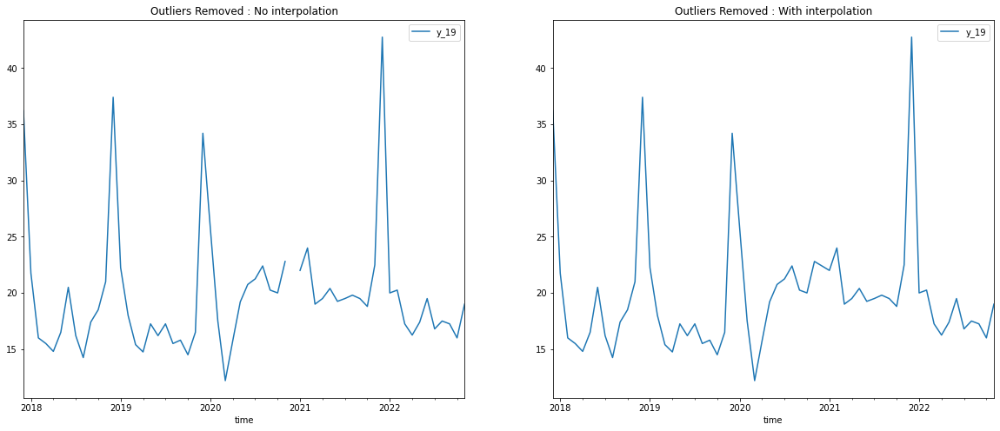

In [25]:
# The code plots the time series for each of the 20 keywords.
# The left plot shows the time series with outliers removed but no interpolation.
# The right plot shows the time series with outliers removed and interpolation.
# The interpolation is done using the linear interpolation method.
# The interpolation is done to fill the missing values in the time series.

ts_headers = ['y_0', 'y_1', 'y_2', 'y_3', 'y_4', 'y_5', 'y_6', 'y_7', 'y_8', 'y_9', 'y_10',
              'y_11', 'y_12', 'y_13', 'y_14', 'y_15', 'y_16', 'y_17', 'y_18', 'y_19']

for i in ts_headers:
    fig, ax = plt.subplots(figsize=(20,8), nrows=1, ncols=2)

    trends_US_ts_outliers_removed.to_dataframe().plot(x = 'time', y = i, ax= ax[0])
    ax[0].set_title("Outliers Removed : No interpolation")
    trends_US_ts_outliers_interpolated.to_dataframe().plot(x = 'time', y = i, ax= ax[1])
    ax[1].set_title("Outliers Removed : With interpolation")
    plt.show()

## 3.2 Removing outliers for France trends

In [26]:
#REMOVING OUTLIERS FOR FRANCE TRENDS

trends_FR.columns = ['time', 'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR', 
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR', 
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR', 
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR']

# Transform the outlier data into `TimeSeriesData` Object
trends_FR_ts = TimeSeriesData(trends_FR) 

ts_outlierDetection = OutlierDetector(trends_FR_ts, 'additive') # call OutlierDetector
ts_outlierDetection.detector() # apply OutlierDetector

trends_FR_ts_outliers_removed = ts_outlierDetection.remover(interpolate = False) # No interpolation
trends_FR_ts_outliers_interpolated = ts_outlierDetection.remover(interpolate = True) # With interpolation

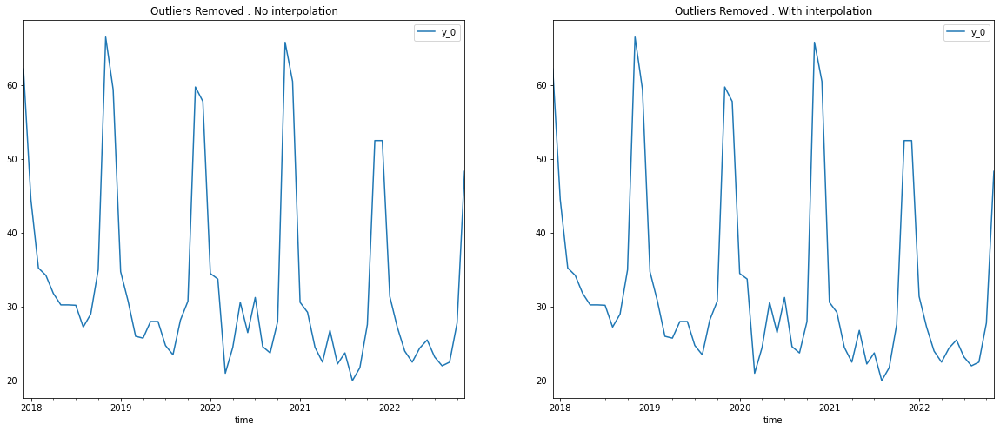

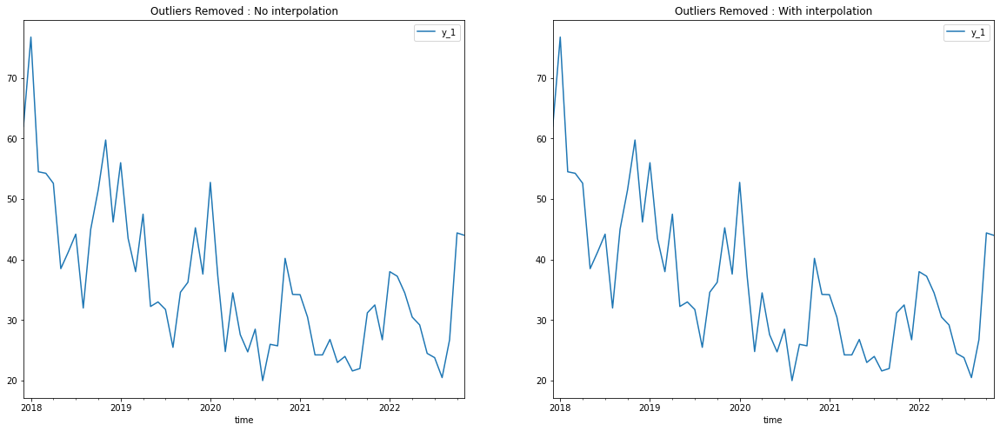

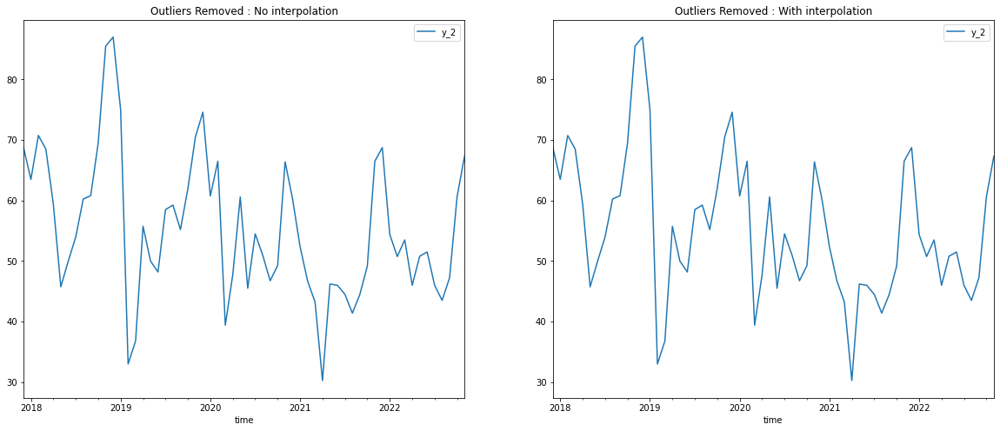

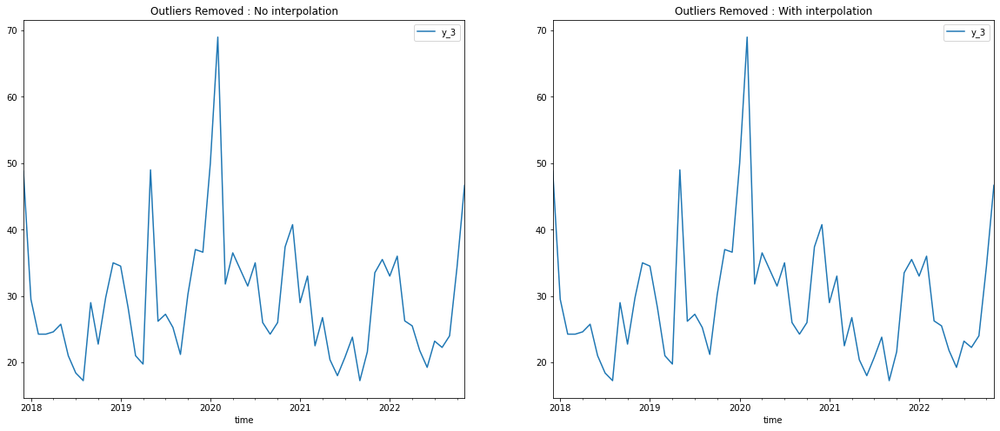

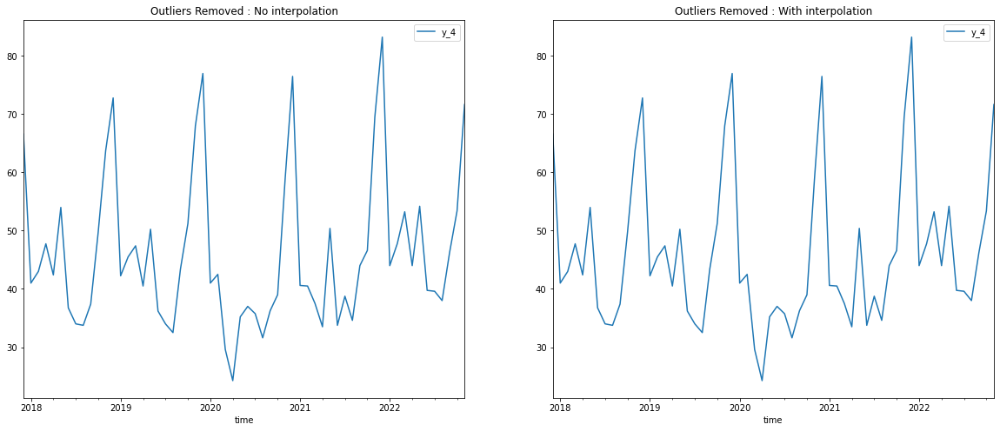

...

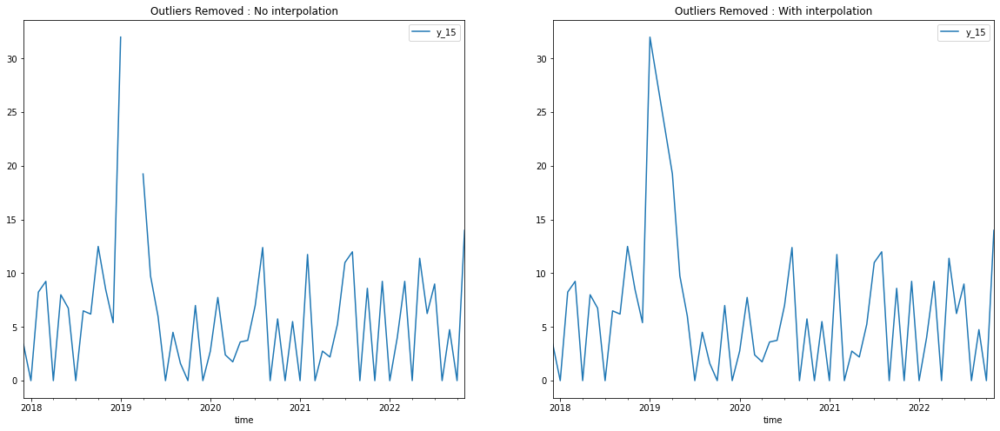

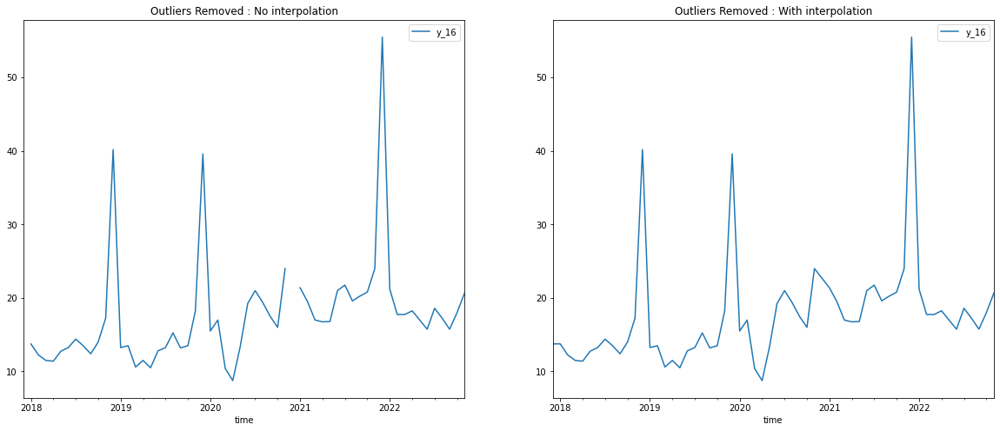

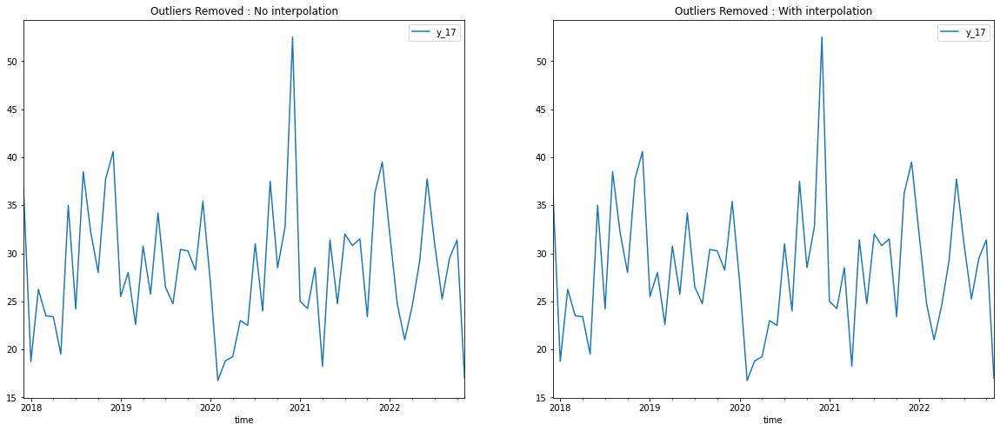

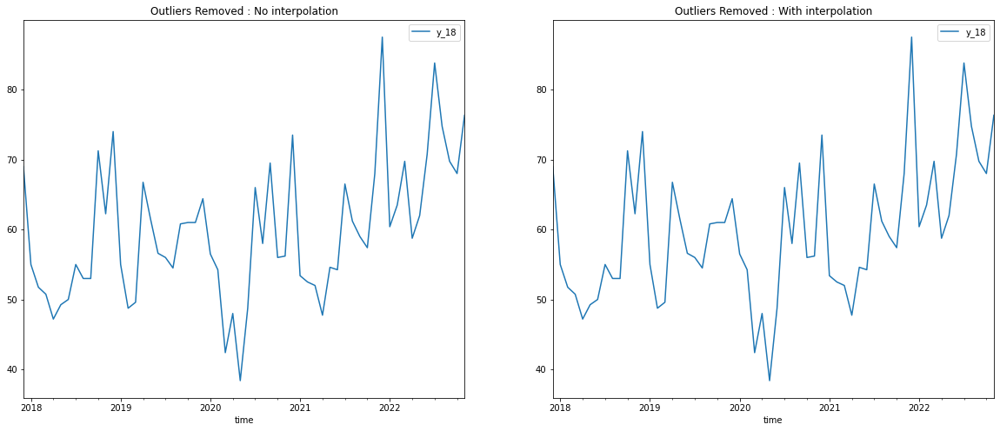

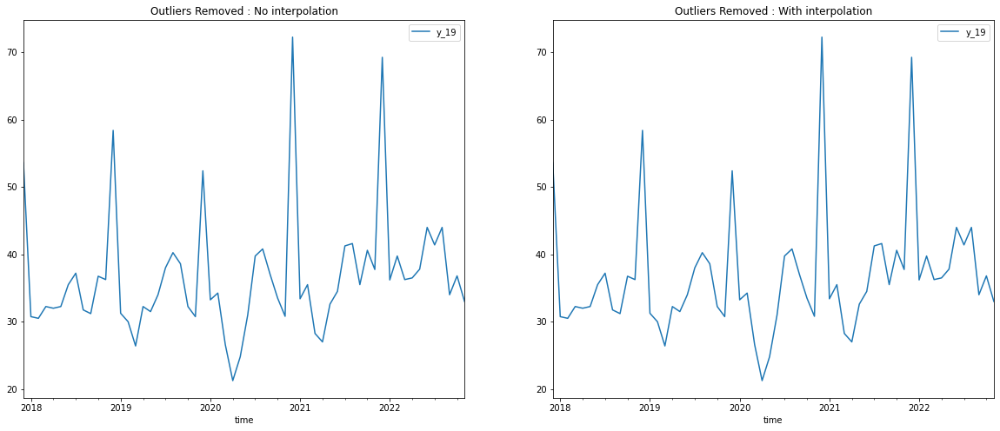

In [27]:
ts_headers = ['y_0', 'y_1', 'y_2', 'y_3', 'y_4', 'y_5', 'y_6', 'y_7', 'y_8', 'y_9', 'y_10',
              'y_11', 'y_12', 'y_13', 'y_14', 'y_15', 'y_16', 'y_17', 'y_18', 'y_19']
for i in ts_headers:
    fig, ax = plt.subplots(figsize=(20,8), nrows=1, ncols=2)

    trends_FR_ts_outliers_removed.to_dataframe().plot(x = 'time', y = i, ax= ax[0])
    ax[0].set_title("Outliers Removed : No interpolation")
    trends_FR_ts_outliers_interpolated.to_dataframe().plot(x = 'time', y = i, ax= ax[1])
    ax[1].set_title("Outliers Removed : With interpolation")
    plt.show()

## 3.3 Removing outliers for Japan trends

In [28]:
#REMOVING OUTLIERS FOR JAPAN TRENDS

trends_JP.columns = ['time', 'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP', 
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP', 
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP', 
                   'Moët & Chandon-JP']

# Transform the outlier data into `TimeSeriesData` Object
trends_JP_ts = TimeSeriesData(trends_JP) 

ts_outlierDetection = OutlierDetector(trends_JP_ts, 'additive') # call OutlierDetector
ts_outlierDetection.detector() # apply OutlierDetector

trends_JP_ts_outliers_removed = ts_outlierDetection.remover(interpolate = False) # No interpolation
trends_JP_ts_outliers_interpolated = ts_outlierDetection.remover(interpolate = True) # With interpolation

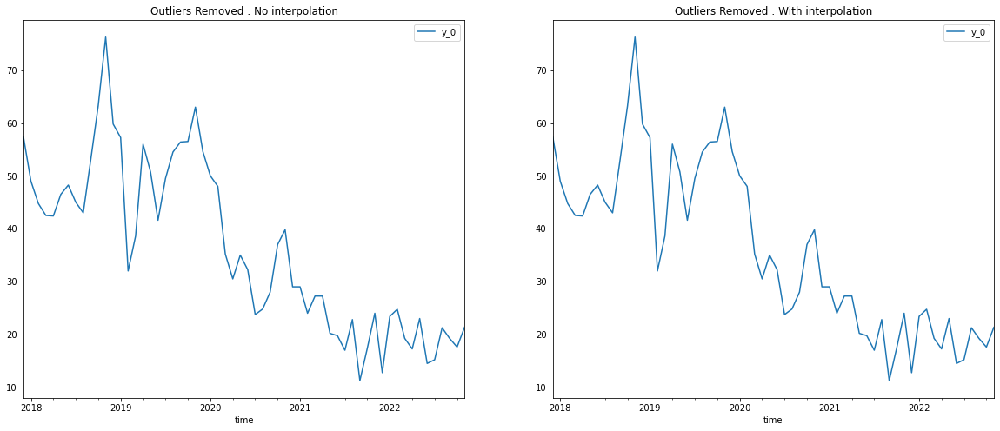

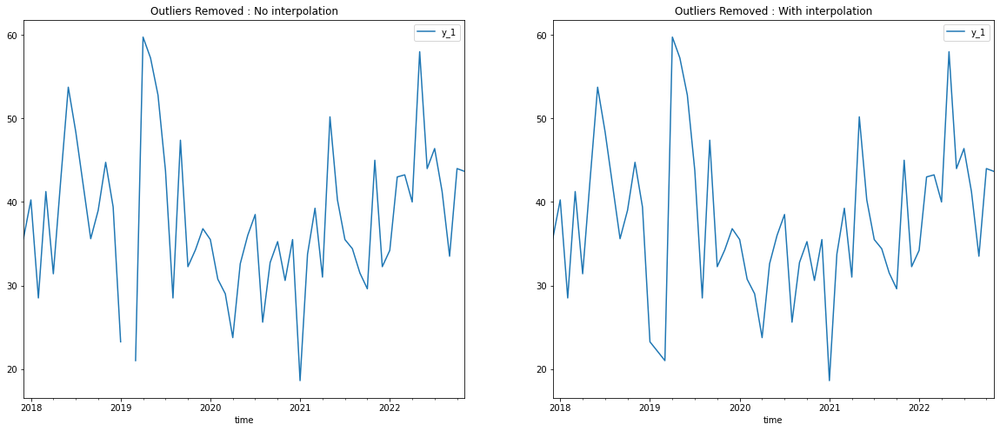

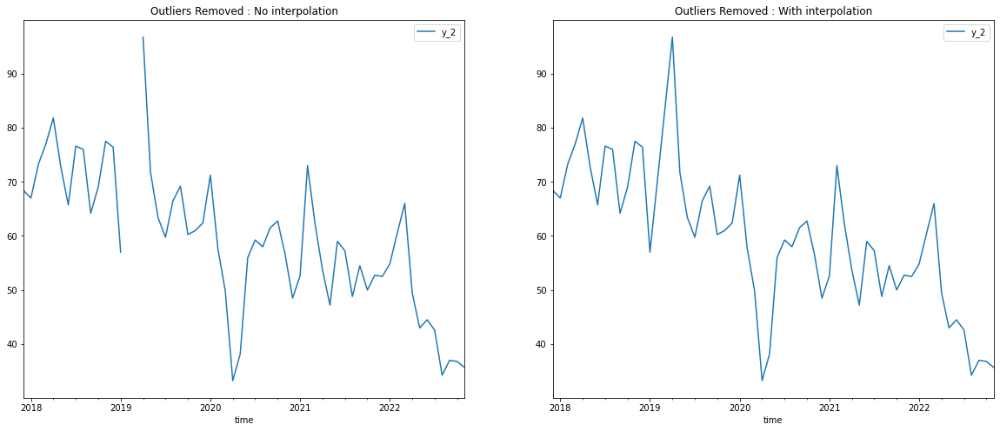

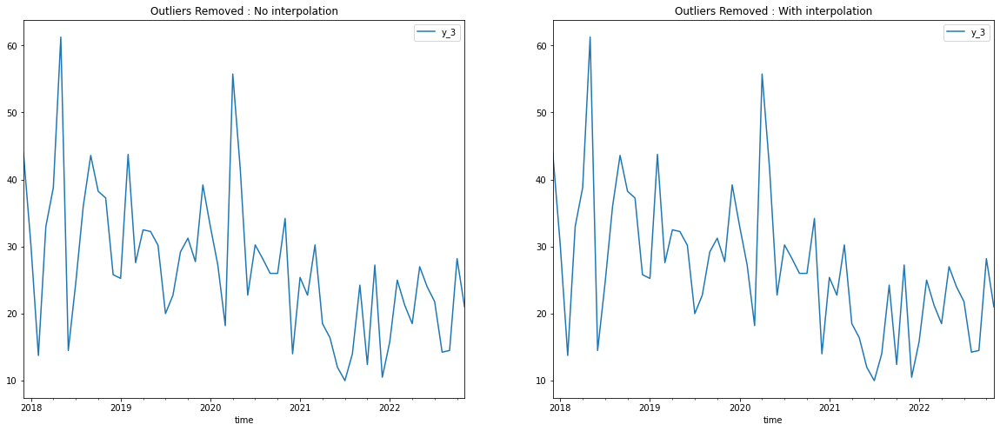

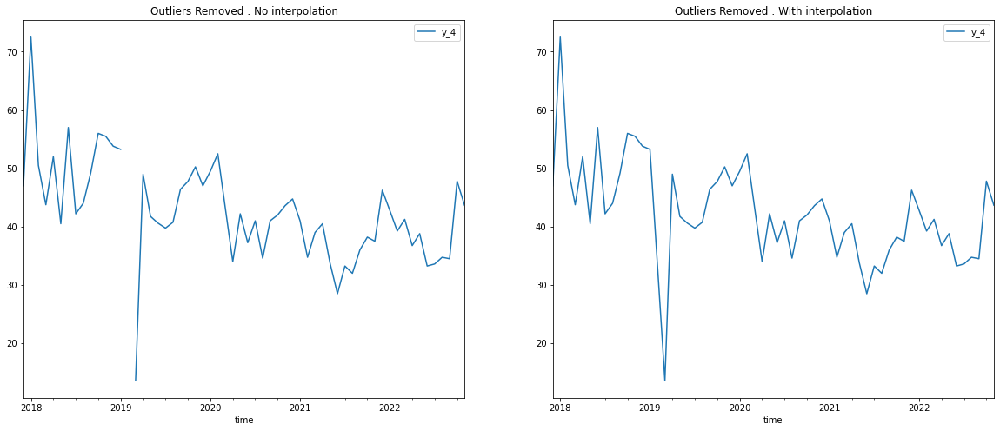

...

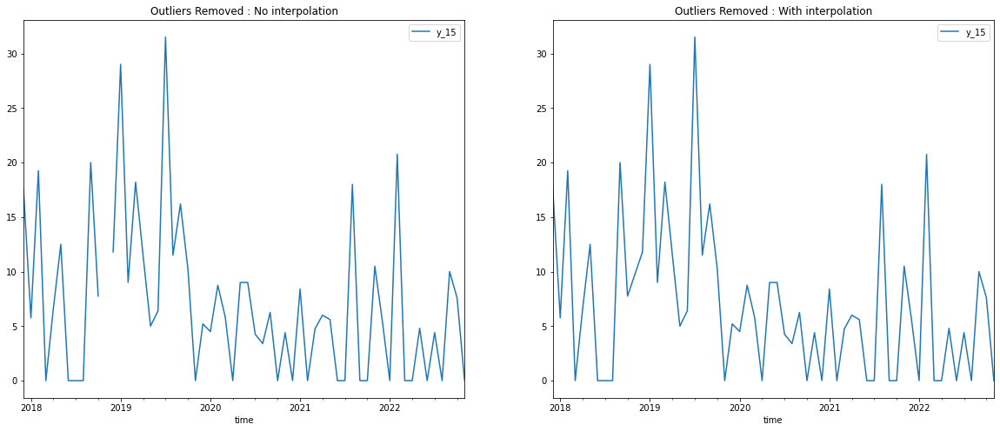

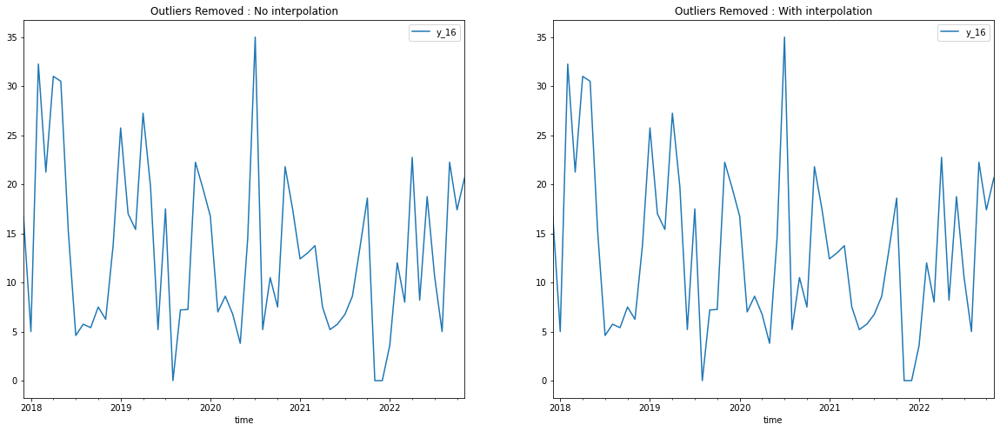

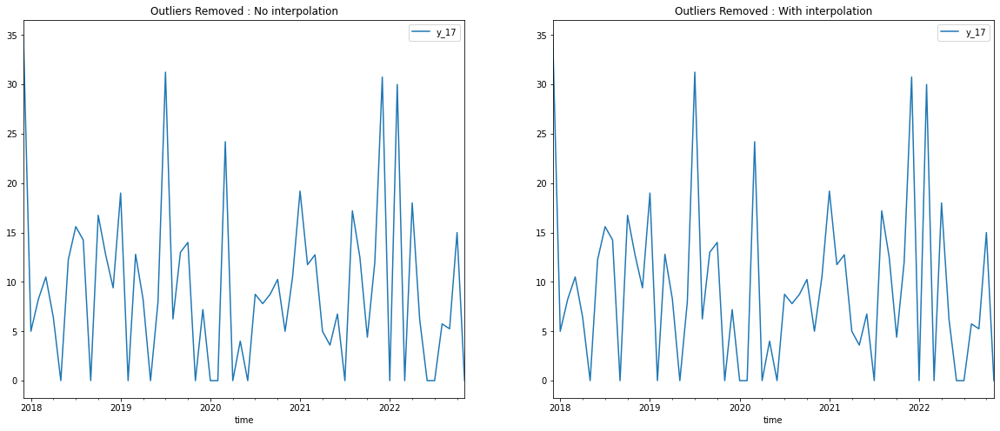

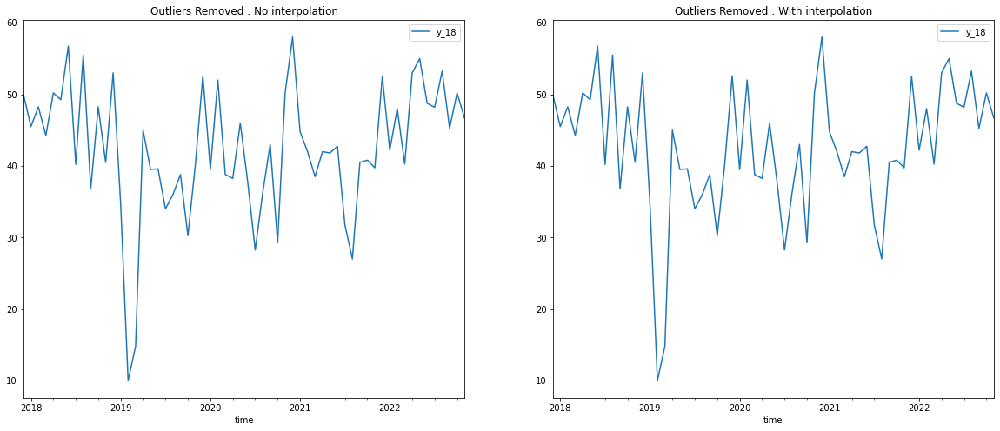

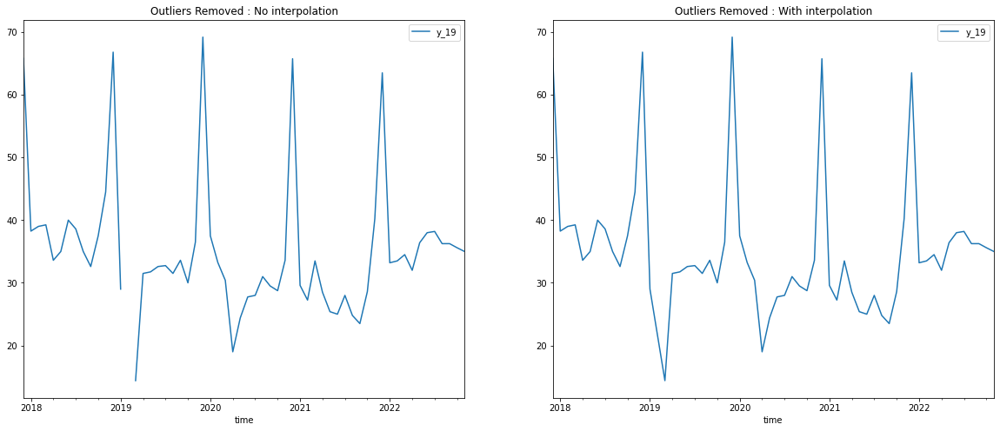

In [29]:
ts_headers = ['y_0', 'y_1', 'y_2', 'y_3', 'y_4', 'y_5', 'y_6', 'y_7', 'y_8', 'y_9', 'y_10',
              'y_11', 'y_12', 'y_13', 'y_14', 'y_15', 'y_16', 'y_17', 'y_18', 'y_19']
for i in ts_headers:
    fig, ax = plt.subplots(figsize=(20,8), nrows=1, ncols=2)

    trends_JP_ts_outliers_removed.to_dataframe().plot(x = 'time', y = i, ax= ax[0])
    ax[0].set_title("Outliers Removed : No interpolation")
    trends_JP_ts_outliers_interpolated.to_dataframe().plot(x = 'time', y = i, ax= ax[1])
    ax[1].set_title("Outliers Removed : With interpolation")
    plt.show()

In [30]:
# We can count the number of observations that were considered as outliers
trends_US_out = trends_US_ts_outliers_removed.to_array()
trends_FR_out = trends_FR_ts_outliers_removed.to_array()
trends_JP_out = trends_JP_ts_outliers_removed.to_array()

trends_US_out = pd.DataFrame(trends_US_out, columns=['date', 'Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US', 
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US', 
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US'])
trends_FR_out = pd.DataFrame(trends_FR_out, columns=['date', 'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR', 
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR', 
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR', 
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR'])
trends_JP_out = pd.DataFrame(trends_JP_out, columns=['date', 'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP', 
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP', 
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP', 
                   'Moët & Chandon-JP'])

In [31]:
trends_US_out.isnull().sum()

date                       0
Sephora-US                 0
Make Up For Ever-US        0
Benefit Cosmetics-US       0
Fenty Beauty-US            1
Guerlain-US                0
Louis Vuitton-US           0
Christian Dior-US          4
Givenchy-US                2
Marc Jacobs-US             0
Kenzo-US                   2
Loewe-US                   1
Fendi-US                   0
Celine-US                  3
Dom Pérignon-US            1
Veuve Clicquot-US          1
Chandon-US                 0
Ruinart-US                 1
Château Cheval Blanc-US    0
Hennessy-US                0
Moët & Chandon-US          1
dtype: int64

In [32]:
trends_FR_out.isnull().sum()

date                       0
Sephora-FR                 0
Make Up For Ever-FR        0
Benefit Cosmetics-FR       0
Fenty Beauty-FR            0
Guerlain-FR                0
Louis Vuitton-FR           0
Christian Dior-FR          0
Givenchy-FR                1
Marc Jacobs-FR             0
Kenzo-FR                   1
Loewe-FR                   1
Fendi-FR                   0
Celine-FR                  9
Dom Pérignon-FR            1
Veuve Clicquot-FR          1
Chandon-FR                 2
Ruinart-FR                 2
Château Cheval Blanc-FR    0
Hennessy-FR                0
Moët & Chandon-FR          0
dtype: int64

In [33]:
trends_JP_out.isnull().sum()

date                       0
Sephora-JP                 0
Make Up For Ever-JP        1
Benefit Cosmetics-JP       2
Fenty Beauty-JP            0
Guerlain-JP                1
Louis Vuitton-JP           1
Christian Dior-JP          0
Givenchy-JP                0
Marc Jacobs-JP             1
Kenzo-JP                   2
Loewe-JP                   2
Fendi-JP                   0
Celine-JP                  0
Dom Pérignon-JP            0
Veuve Clicquot-JP          3
Chandon-JP                 1
Ruinart-JP                 0
Château Cheval Blanc-JP    0
Hennessy-JP                0
Moët & Chandon-JP          1
dtype: int64

In [34]:
# FINAL TIME SERIES WITH DETECTED AND REPLACED OUTLIERS
trends_US_final = trends_US_ts_outliers_interpolated.to_array()
trends_FR_final = trends_FR_ts_outliers_interpolated.to_array()
trends_JP_final = trends_JP_ts_outliers_interpolated.to_array()

trends_US_final = pd.DataFrame(trends_US_final, columns=['date', 'Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US', 
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US', 
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US'])
trends_FR_final = pd.DataFrame(trends_FR_final, columns=['date', 'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR', 
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR', 
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR', 
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR'])
trends_JP_final = pd.DataFrame(trends_JP_final, columns=['date', 'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP', 
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP', 
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP', 
                   'Moët & Chandon-JP'])

In [35]:
trends_US_final

,date,Sephora-US,Make Up For Ever-US,Benefit Cosmetics-US,Fenty Beauty-US,Guerlain-US,Louis Vuitton-US,Christian Dior-US,Givenchy-US,Marc Jacobs-US,...,Loewe-US,Fendi-US,Celine-US,Dom Pérignon-US,Veuve Clicquot-US,Chandon-US,Ruinart-US,Château Cheval Blanc-US,Hennessy-US,Moët & Chandon-US
0,2017-12-31,75.6,81.6,80.2,45.75,80.2,69.0,20.4,51.2,39.0,...,17.2,48.2,56.2,40.4,36.4,67.8,27.0,33.6,74.8,36.2
1,2018-01-31,46.25,67.25,79.5,45.75,67.75,51.5,15.25,40.25,22.0,...,16.75,37.75,58.5,18.5,18.0,34.25,5.25,14.75,55.5,21.75
2,2018-02-28,43.75,71.75,75.75,36.75,72.25,52.0,16.25,42.25,26.5,...,18.0,45.5,52.0,17.0,14.5,40.5,7.25,25.25,49.0,16.0
3,2018-03-31,43.25,63.75,77.75,38.0,69.25,49.0,15.75,54.0,22.75,...,18.75,40.25,54.0,16.5,18.0,37.0,7.25,10.0,49.75,15.5
4,2018-04-30,50.0,69.2,71.6,45.0,67.8,48.4,16.4,37.8,27.6,...,20.0,52.2,54.2,16.2,18.0,37.0,15.0,21.6,52.6,14.8
5,2018-05-31,41.0,57.75,66.25,48.5,65.5,49.5,17.25,49.5,25.5,...,18.25,55.75,54.0,20.5,13.25,37.5,14.25,25.0,54.75,16.5
6,2018-06-30,41.0,51.5,67.25,34.25,58.5,48.25,17.25,42.0,22.75,...,18.5,47.25,49.75,19.0,13.25,40.5,7.0,8.75,56.0,20.5
7,2018-07-31,41.4,57.2,69.4,33.4,55.0,49.2,16.6,40.6,22.0,...,19.8,51.6,52.8,19.2,16.8,39.8,15.4,11.4,56.6,16.2
8,2018-08-31,44.75,57.25,75.75,24.75,62.0,48.5,16.5,37.25,21.75,...,18.5,53.0,53.75,17.5,15.75,33.75,18.5,19.0,52.5,14.25
9,2018-09-30,40.2,58.6,68.2,32.4,54.4,42.0,17.8,36.2,20.8,...,18.8,53.0,53.125,16.4,12.6,33.8,16.4,23.4,52.8,17.4


In [36]:
# Plot the same graph of Christian Dior but now without the outlier and with the data interpolated
fig = px.line(trends_US_final, x="date", y=['Christian Dior-US'], 
              title='Keyword Web Search Interest Over Time')
fig.show()

In [37]:
# Define list of DataFrames
dfs = [trends_US_final, trends_FR_final, trends_JP_final]
from functools import reduce

#merge all DataFrames into one
final_df = reduce(lambda  left,right: pd.merge(left,right,on=['date'],
                                            how='outer'), dfs)

final_df

,date,Sephora-US,Make Up For Ever-US,Benefit Cosmetics-US,Fenty Beauty-US,Guerlain-US,Louis Vuitton-US,Christian Dior-US,Givenchy-US,Marc Jacobs-US,...,Loewe-JP,Fendi-JP,Celine-JP,Dom Pérignon-JP,Veuve Clicquot-JP,Chandon-JP,Ruinart-JP,Château Cheval Blanc-JP,Hennessy-JP,Moët & Chandon-JP
0,2017-12-31,75.6,81.6,80.2,45.75,80.2,69.0,20.4,51.2,39.0,...,8.6,49.8,32.4,73.2,54.6,17.6,16.8,34.8,50.0,65.8
1,2018-01-31,46.25,67.25,79.5,45.75,67.75,51.5,15.25,40.25,22.0,...,8.75,47.0,32.25,59.0,33.5,5.75,5.0,5.0,45.5,38.25
2,2018-02-28,43.75,71.75,75.75,36.75,72.25,52.0,16.25,42.25,26.5,...,7.5,36.75,28.0,44.75,28.75,19.25,32.25,8.25,48.25,39.0
3,2018-03-31,43.25,63.75,77.75,38.0,69.25,49.0,15.75,54.0,22.75,...,8.0,34.5,26.25,44.25,32.25,0.0,21.25,10.5,44.25,39.25
4,2018-04-30,50.0,69.2,71.6,45.0,67.8,48.4,16.4,37.8,27.6,...,7.0,34.4,26.0,41.6,29.4,6.6,31.0,6.4,50.2,33.6
5,2018-05-31,41.0,57.75,66.25,48.5,65.5,49.5,17.25,49.5,25.5,...,7.75,34.75,25.25,45.75,29.75,12.5,30.5,0.0,49.25,35.0
6,2018-06-30,41.0,51.5,67.25,34.25,58.5,48.25,17.25,42.0,22.75,...,7.5,37.0,28.0,38.0,33.75,0.0,15.25,12.25,56.75,40.0
7,2018-07-31,41.4,57.2,69.4,33.4,55.0,49.2,16.6,40.6,22.0,...,6.4,36.4,24.0,37.6,27.2,0.0,4.6,15.6,40.2,38.6
8,2018-08-31,44.75,57.25,75.75,24.75,62.0,48.5,16.5,37.25,21.75,...,8.0,43.25,27.75,38.75,30.5,0.0,5.75,14.25,55.5,35.0
9,2018-09-30,40.2,58.6,68.2,32.4,54.4,42.0,17.8,36.2,20.8,...,8.2,48.2,39.2,43.6,29.2,20.0,5.4,0.0,36.8,32.6


# 4. Clustering

- Its primary purpose is to detect comparable time series patterns and reveal underlying information in the data.
- Elbow method and Silhouette method for selecting the number of clusters.
- Clustering methods: K-means and hierarchical clustering.
- DTW Barycenter Averaging (DBA) algorithm for computing the average of the series within a cluster.

In [38]:
pip install tslearn

Note: you may need to restart the kernel to use updated packages.


In [39]:
pip install scikit-learn-extra

Note: you may need to restart the kernel to use updated packages.


In [40]:
trends_US_final.set_index('date', inplace = True)
trends_FR_final.set_index('date', inplace = True)
trends_JP_final.set_index('date', inplace = True)

In [41]:
#We transform the series into arrays to manage them better for the clustering
series_US = trends_US_final.to_numpy().T
series_FR = trends_FR_final.to_numpy().T
series_JP = trends_JP_final.to_numpy().T

In [42]:
series_US

array([[75.6, 46.25, 43.75, ..., 35.75, 42.2, 55.0],
       [81.6, 67.25, 71.75, ..., 33.75, 44.0, 41.333333333333336],
       [80.2, 79.5, 75.75, ..., 44.75, 45.2, 52.66666666666666],
       ...,
       [33.6, 14.75, 25.25, ..., 27.0, 15.8, 28.0],
       [74.8, 55.5, 49.0, ..., 41.5, 47.2, 47.0],
       [36.2, 21.75, 16.0, ..., 17.25, 16.0, 19.0]], dtype=object)

In [43]:
print(len(series_US))

20


### 4.1 Selection of number of clusters

US: Elbow method and Silhouette method

In [44]:
# Elbow method 
from sklearn.cluster import KMeans
from tslearn.clustering import TimeSeriesKMeans
import sklearn.cluster as cluster
distortions = []
K = range(1,20)

for cluster_size in K:
    kmeans = cluster.KMeans(n_clusters=cluster_size, init='k-means++', random_state = 1000)
    kmeans = kmeans.fit(series_US)
    distortions.append(kmeans.inertia_)
    
df = pd.DataFrame({'Clusters': K, 'Sum of squared distances': distortions})
fig = (px.line(df, x='Clusters', y='Sum of squared distances', template='seaborn', title = 'Elbow Method For Optimal k')).update_traces(mode='lines+markers')
fig.show()

In [45]:
# Silhouette method
import sklearn.metrics as metrics
silhouette_scores = []
K = range(2,12)

for cluster_size in K:
    kmeans = TimeSeriesKMeans(n_clusters=cluster_size, init='k-means++', random_state=1000)
    labels = kmeans.fit(series_US).labels_
    silhouette_score = metrics.silhouette_score(series_US, 
                                                labels, 
                                                metric='euclidean', 
                                                sample_size=1000, 
                                                random_state=1000)
    
    silhouette_scores.append(silhouette_score)

df = pd.DataFrame({'Clusters': K, 'Silhouette Score': silhouette_scores})
fig = (px.line(df, x='Clusters', y='Silhouette Score', template='seaborn', title = 'Silhouette Method For Optimal k')).update_traces(mode='lines+markers')
fig.show()

### 4.2.1 Cluster with K-means (for US)
It is a very basic way that can include euclidean, dynamic time warping, or soft dynamic time warping. We do it for dynamic time warping

In [46]:
# K-means with dynamic time warping
from tslearn.clustering import TimeSeriesKMeans
model = TimeSeriesKMeans(n_clusters=4, metric="dtw", random_state = 100)
labels = model.fit_predict(series_US)
labels

array([1, 1, 2, 1, 2, 2, 0, 1, 0, 1, 0, 2, 2, 3, 3, 1, 3, 3, 2, 3])

In [47]:
# Dataframe to know to which cluster corresponds each series
headers = list(trends_US_final.columns) #Get headers
data_tuples = list(zip(headers,labels)) #Zip the headers and the labels of the clusters
clusters_US = pd.DataFrame(data_tuples, columns=['trend','cluster']).sort_values(by="cluster").set_index("trend")
clusters_US

,cluster
trend,
Loewe-US,0
Marc Jacobs-US,0
Christian Dior-US,0
Sephora-US,1
Chandon-US,1
Givenchy-US,1
Kenzo-US,1
Fenty Beauty-US,1
Make Up For Ever-US,1


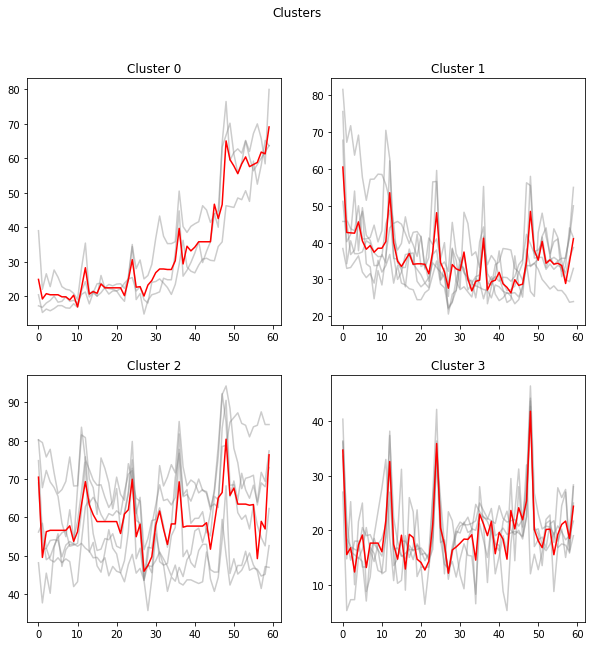

In [48]:
# Plot the cluster with each series in gray and with the average of the cluster in red (method of dtw_barycenter_averaging)

import math
from tslearn.barycenters import dtw_barycenter_averaging

plot_count = math.ceil(math.sqrt(4))

fig, axs = plt.subplots(plot_count,plot_count,figsize=(10,10))
fig.suptitle('Clusters')
row_i=0
column_j=0
#plot every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series_US[i],c="gray",alpha=0.4)
                cluster.append(series_US[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(dtw_barycenter_averaging(np.vstack(cluster)),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*2+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

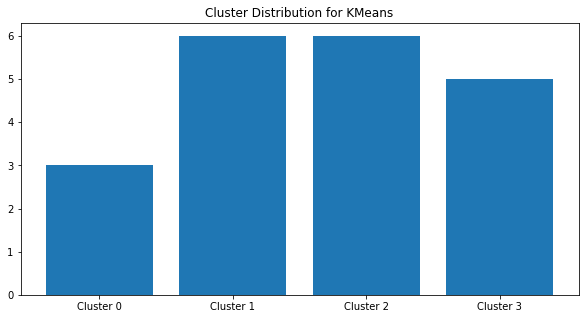

In [49]:
# To see how many series we have in each cluster
cluster_c = [len(labels[labels==i]) for i in range(4)]
cluster_n = ["Cluster "+str(i) for i in range(4)]
plt.figure(figsize=(10,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [50]:
# To add all the series from a cluster in an unique array
cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
for i in range(len(labels)):
        if labels[i] == 0:
            cluster0.append(series_US[i])
        if labels[i] == 1:
            cluster1.append(series_US[i])
        if labels[i] == 2:
            cluster2.append(series_US[i])
        if labels[i] == 3:
            cluster3.append(series_US[i])

In [51]:
cluster3

[array([40.4, 18.5, 17.0, 16.5, 16.2, 20.5, 19.0, 19.2, 17.5, 16.4, 15.25,
        18.75, 38.2, 16.5, 16.75, 15.2, 15.75, 16.5, 16.4, 16.5, 16.75,
        15.8, 15.0, 18.75, 36.4, 20.75, 16.5, 12.4, 17.0, 20.2, 21.5, 21.0,
        21.0, 21.25, 21.75, 25.0, 23.6, 22.2, 21.75, 21.25, 24.5, 22.2,
        21.5, 21.75, 22.0, 20.75, 22.0, 28.5, 46.5, 26.8, 23.0, 20.25,
        20.75, 20.6, 19.25, 20.8, 19.75, 18.25, 19.0, 21.666666666666668],
       dtype=object),
 array([36.4, 18.0, 14.5, 18.0, 18.0, 13.25, 13.25, 16.8, 15.75, 12.6,
        12.25, 19.0, 32.4, 13.5, 14.75, 18.0, 18.0, 16.5, 14.6, 17.5,
        16.25, 14.4, 15.75, 26.25, 42.2, 17.75, 18.25, 11.0, 16.0, 19.8,
        19.5, 21.5, 19.6, 20.0, 24.75, 23.4, 22.5, 21.6, 19.75, 17.25,
        16.25, 21.6, 23.5, 20.0, 19.2, 20.0, 18.4, 22.5, 44.25, 17.0,
        18.25, 18.75, 16.75, 21.2, 21.75, 18.0, 20.25, 15.0, 19.8,
        28.33333333333333], dtype=object),
 array([27.0, 5.25, 7.25, 7.25, 15.0, 14.25, 7.0, 15.4, 18.5, 16.4, 12.0

In [52]:
# To extract the average of the series in cluster 0, 1, and 2 (method used is dtw_barycenter_averaging)
cluster0_average = dtw_barycenter_averaging(cluster0, max_iter=5)
cluster1_average = dtw_barycenter_averaging(cluster1, max_iter=5)
cluster2_average = dtw_barycenter_averaging(cluster2, max_iter=5)
cluster3_average = dtw_barycenter_averaging(cluster3, max_iter=5)

In [53]:
clusters_US = [cluster0_average, cluster1_average, cluster2_average, cluster3_average]
clusters_US

[array([[24.85555556],
        [19.18      ],
        [20.71666667],
        [20.4       ],
        [20.4       ],
        [20.4       ],
        [19.8       ],
        [19.8       ],
        [18.90625   ],
        [20.275     ],
        [16.87916667],
        [22.33333333],
        [28.25      ],
        [20.6       ],
        [21.33333333],
        [20.83333333],
        [23.53571429],
        [22.41666667],
        [22.41666667],
        [22.41666667],
        [22.41666667],
        [22.41666667],
        [20.14375   ],
        [24.75      ],
        [30.58      ],
        [22.6       ],
        [22.75      ],
        [20.03333333],
        [23.21666667],
        [24.53333333],
        [26.81666667],
        [27.88333333],
        [27.88333333],
        [27.73333333],
        [27.73333333],
        [30.28333333],
        [39.67      ],
        [29.35      ],
        [34.4875    ],
        [33.13333333],
        [34.21666667],
        [35.78333333],
        [35.78333333],
        [35

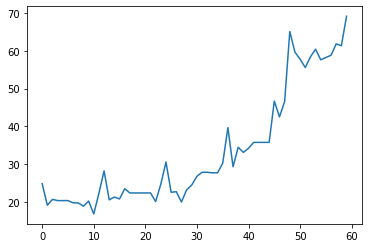

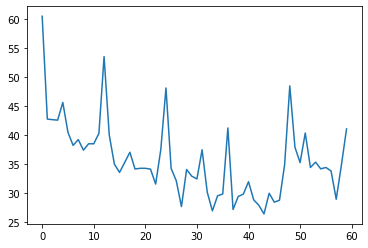

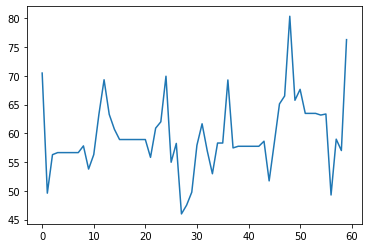

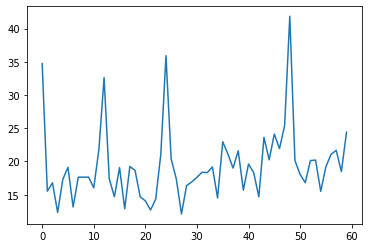

In [54]:
# To plot the average of the clusters
from matplotlib import pyplot as plt

for i in clusters_US:
    plt.plot(i)
    plt.show()

### 4.2.2 Agglomerative Clustering

It is an unsupervised learning technique that uses a bottom-up strategy to produce hierarchical clustering: each observation begins in its own cluster, and clusters are sequentially aggregated into bigger superclusters.

In [55]:
from sklearn.cluster import AgglomerativeClustering
from tslearn.barycenters import dtw_barycenter_averaging
import math

Assignment of cluster to the trends per country:

- Agglomerative Clustering for US:

In [56]:
# Agglomerative Clustering for US
aggloclust = AgglomerativeClustering(n_clusters=4, linkage="ward")
aggloclust = aggloclust.fit(series_US)
labels_agglo_US = aggloclust.labels_
labels_agglo_US

array([1, 1, 0, 1, 0, 0, 3, 1, 3, 1, 3, 0, 0, 2, 2, 1, 2, 2, 0, 2])

In [57]:
# Now we want to plot the dedrogram
brand_list_agg = ['Sephora', 'Make Up For Ever', 'Benefit Cosmetics', 'Fenty Beauty', 'Guerlain',
                     'Louis Vuitton', 'Christian Dior', 'Givenchy', 'Marc Jacobs', 'Kenzo','Loewe', 
                     'Fendi', 'Celine','Dom Pérignon', 'Veuve Clicquot', 'Chandon', 'Ruinart', 
                     'Château Cheval Blanc', 'Hennessy', 'Moët & Chandon']

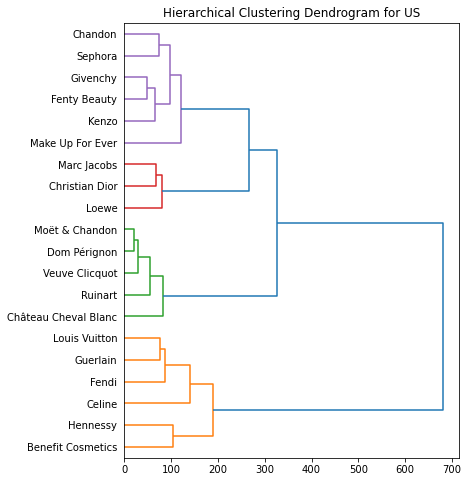

In [58]:
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage

# DENDROGRAM FOR US
linkage_matrix_US = linkage(series_US, 'ward')
plt.figure(figsize=(6, 8))
dendrogram(
    linkage_matrix_US,
    truncate_mode="lastp",  # show only the last p merged clusters
    p=40,  # show only the last p merged clusters
    show_leaf_counts=True,  # numbers in brackets are counts, others idx
    leaf_rotation=0,
    labels=brand_list_agg,
    leaf_font_size=10.,
    show_contracted=True, 
    color_threshold=240,  # to get a distribution impression in truncated branches
    orientation="right"
)
plt.title('Hierarchical Clustering Dendrogram for US')
# Plotting a horizontal line based on the first biggest distance between clusters 
# plt.axhline(240, color='red', linestyle='--'); 
# Plotting a horizontal line based on the second biggest distance between clusters 
# plt.axhline(300, color='crimson'); 
plt.savefig("/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/plots/dendrogram_US.png", dpi=800, bbox_inches="tight", facecolor ="w")
plt.show()


- Agglomerative Clustering and dendrogram for FR:

In [59]:
# Agglomerative Clustering for FR
aggloclust = AgglomerativeClustering(n_clusters=4).fit(series_FR)
labels_agglo_FR = aggloclust.labels_
labels_agglo_FR

array([0, 0, 3, 0, 1, 3, 1, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 3, 0])

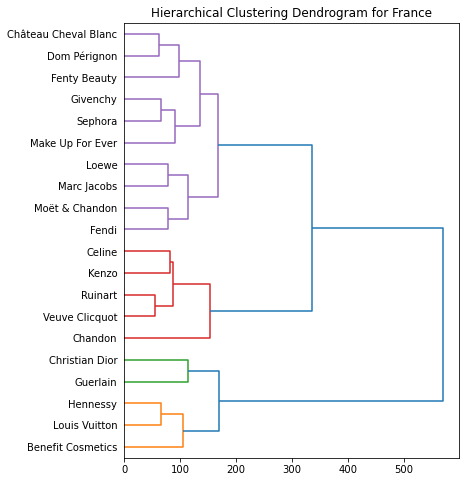

In [60]:
# DENDROGRAM FOR FRANCE
linkage_matrix_FR = linkage(series_FR, 'ward')
plt.figure(figsize=(6, 8))
dendrogram(
    linkage_matrix_FR,
    truncate_mode="lastp",  # show only the last p merged clusters
    p=40,  # show only the last p merged clusters
    show_leaf_counts=True,  # numbers in brackets are counts, others idx
    leaf_rotation=0,
    labels=brand_list_agg,
    leaf_font_size=10.,
    show_contracted=True, 
    color_threshold=168.5,  # to get a distribution impression in truncated branches
    orientation="right"
)
plt.title('Hierarchical Clustering Dendrogram for France')
plt.savefig("/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/plots/dendrogram_FR.png", dpi=800, bbox_inches="tight", facecolor ="w")
plt.show()

- Agglomerative Clustering and dendrogram for JP:

In [61]:
# Agglomerative Clustering for JP
aggloclust = AgglomerativeClustering(n_clusters=4).fit(series_JP)
labels_agglo_JP = aggloclust.labels_
labels_agglo_JP

array([0, 0, 2, 0, 0, 2, 3, 2, 2, 1, 1, 2, 3, 0, 0, 1, 1, 1, 0, 0])

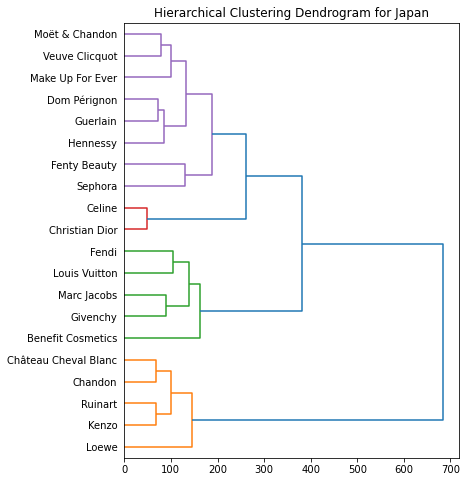

In [62]:
# DENDROGRAM FOR JAPAN
linkage_matrix_JP = linkage(series_JP, 'ward')
plt.figure(figsize=(6, 8))
dendrogram(
    linkage_matrix_JP,
    truncate_mode="lastp",  # show only the last p merged clusters
    p=40,  # show only the last p merged clusters
    show_leaf_counts=True,  # numbers in brackets are counts, others idx
    leaf_rotation=0,
    labels=brand_list_agg,
    leaf_font_size=10.,
    show_contracted=True, 
    color_threshold=240,  # to get a distribution impression in truncated branches
    orientation="right"
)
plt.title('Hierarchical Clustering Dendrogram for Japan')
plt.savefig("/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/plots/dendrogram_JP.png", dpi=800, bbox_inches="tight", facecolor ="w")
plt.show()

Dataframe for each country showing to which cluster belongs each series:

In [63]:
# Dataframe for US 
headers = list(trends_US_final.columns) #Get headers
data_tuples = list(zip(headers,labels_agglo_US)) #Zip the headers and the labels of the clusters
clusters_US = pd.DataFrame(data_tuples, columns=['trend','cluster']).sort_values(by="cluster").set_index("trend")
clusters_US

,cluster
trend,
Benefit Cosmetics-US,0
Celine-US,0
Guerlain-US,0
Louis Vuitton-US,0
Fendi-US,0
Hennessy-US,0
Sephora-US,1
Chandon-US,1
Kenzo-US,1


In [64]:
# Dataframe for FR
headers = list(trends_FR_final.columns) #Get headers
data_tuples = list(zip(headers,labels_agglo_FR)) #Zip the headers and the labels of the clusters
clusters_FR = pd.DataFrame(data_tuples, columns=['trend','cluster']).sort_values(by="cluster").set_index("trend")
clusters_FR

,cluster
trend,
Sephora-FR,0
Château Cheval Blanc-FR,0
Dom Pérignon-FR,0
Fendi-FR,0
Loewe-FR,0
Marc Jacobs-FR,0
Givenchy-FR,0
Moët & Chandon-FR,0
Fenty Beauty-FR,0


In [65]:
# Dataframe for JP
headers = list(trends_JP_final.columns) #Get headers
data_tuples = list(zip(headers,labels_agglo_JP)) #Zip the headers and the labels of the clusters
clusters_JP = pd.DataFrame(data_tuples, columns=['trend','cluster']).sort_values(by="cluster").set_index("trend")
clusters_JP

,cluster
trend,
Sephora-JP,0
Veuve Clicquot-JP,0
Dom Pérignon-JP,0
Hennessy-JP,0
Moët & Chandon-JP,0
Fenty Beauty-JP,0
Make Up For Ever-JP,0
Guerlain-JP,0
Loewe-JP,1


Plot the clusters, where the series are in gray and the average of each cluster is in red:

In [66]:
plot_count = math.ceil(math.sqrt(4)) #4 is the number of clusters

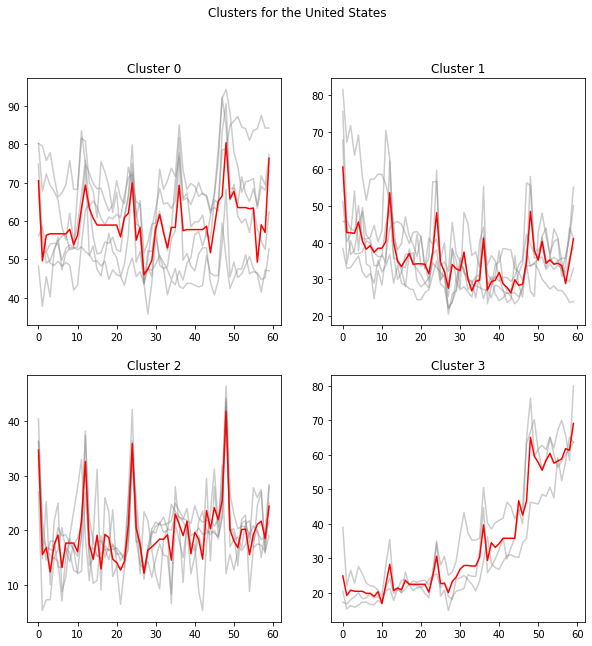

In [67]:
# Plot for US

fig, axs = plt.subplots(plot_count,plot_count,figsize=(10,10))
fig.suptitle('Clusters for the United States')
row_i=0
column_j=0
#plot every series with that label
for label in set(labels_agglo_US):
    cluster = []
    for i in range(len(labels_agglo_US)):
            if(labels_agglo_US[i]==label):
                axs[row_i, column_j].plot(series_US[i],c="gray",alpha=0.4)
                cluster.append(series_US[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(dtw_barycenter_averaging(np.vstack(cluster)),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*2+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0

plt.savefig("/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/plots/cluster_US.png", dpi=800, bbox_inches="tight", facecolor ="w")
plt.show()

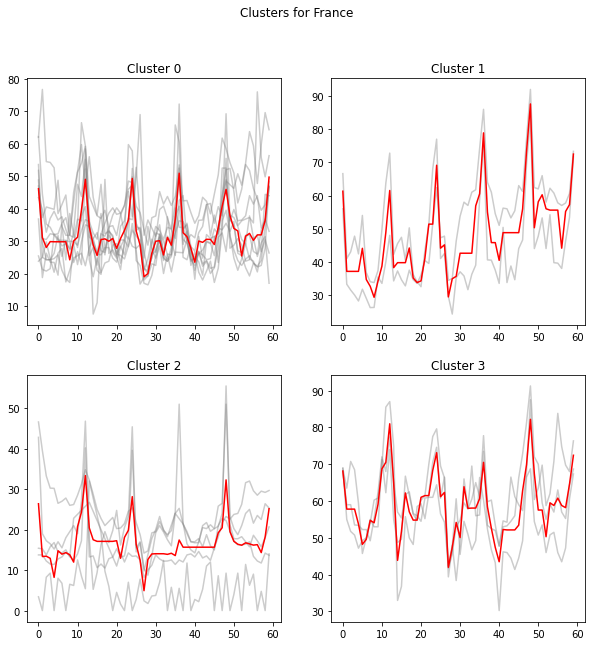

In [68]:
# Plot for FR

fig, axs = plt.subplots(plot_count,plot_count,figsize=(10,10))
fig.suptitle('Clusters for France')
row_i=0
column_j=0
#plot every series with that label
for label in set(labels_agglo_FR):
    cluster = []
    for i in range(len(labels_agglo_FR)):
            if(labels_agglo_FR[i]==label):
                axs[row_i, column_j].plot(series_FR[i],c="gray",alpha=0.4)
                cluster.append(series_FR[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(dtw_barycenter_averaging(np.vstack(cluster)),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*2+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0

plt.savefig("/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/plots/cluster_FR.png", dpi=800, bbox_inches="tight", facecolor ="w")
plt.show()

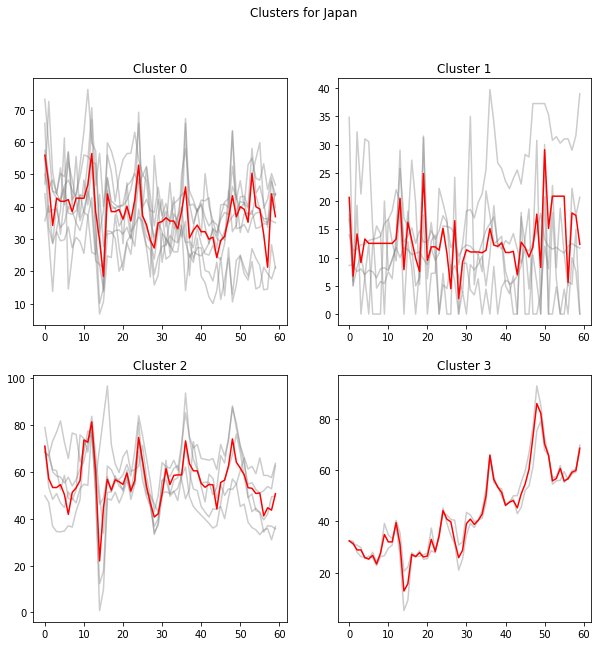

In [69]:
# Plot for JP

fig, axs = plt.subplots(plot_count,plot_count,figsize=(10,10))
fig.suptitle('Clusters for Japan')
row_i=0
column_j=0
#plot every series with that label
for label in set(labels_agglo_JP):
    cluster = []
    for i in range(len(labels_agglo_JP)):
            if(labels_agglo_JP[i]==label):
                axs[row_i, column_j].plot(series_JP[i],c="gray",alpha=0.4)
                cluster.append(series_JP[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(dtw_barycenter_averaging(np.vstack(cluster)),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*2+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.savefig("/Users/marianacerra/Desktop/AMSE/Big Data and Marketing/plots/cluster_JP.png", dpi=800, bbox_inches="tight", facecolor ="w")
plt.show()

Now we plot how many series we have in each cluster for the three countries:

In [70]:
# To see how many series we have in each cluster
cluster_c_US = [len(labels_agglo_US[labels_agglo_US==i]) for i in range(4)]
cluster_c_FR = [len(labels_agglo_FR[labels_agglo_FR==i]) for i in range(4)]
cluster_c_JP = [len(labels_agglo_JP[labels_agglo_JP==i]) for i in range(4)]

cluster_n = ["Cluster "+str(i) for i in range(4)]

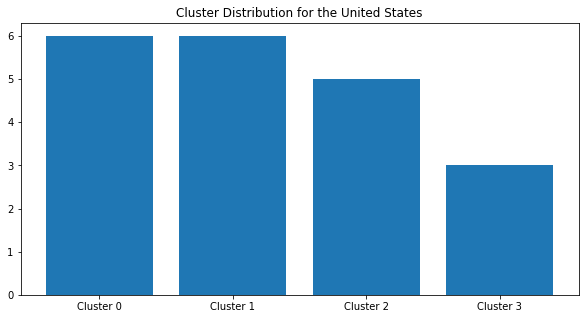

In [71]:
# For US
plt.figure(figsize=(10,5))
plt.title("Cluster Distribution for the United States")
plt.bar(cluster_n,cluster_c_US)
plt.show()

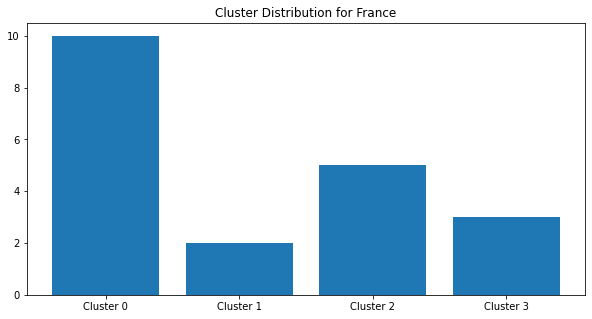

In [72]:
# For FR
plt.figure(figsize=(10,5))
plt.title("Cluster Distribution for France")
plt.bar(cluster_n,cluster_c_FR)
plt.show()

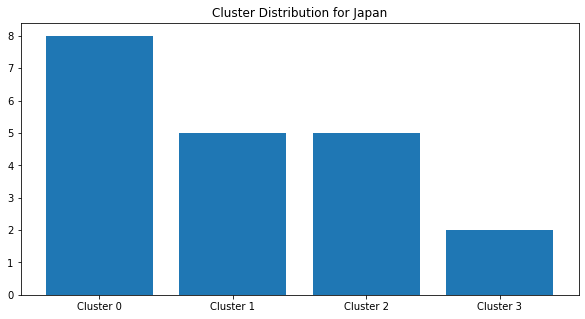

In [73]:
# For JP
plt.figure(figsize=(10,5))
plt.title("Cluster Distribution for Japan")
plt.bar(cluster_n,cluster_c_JP)
plt.show()

To get the average serie of each cluster:

- For US:

In [74]:
# For US: Add all the series from a cluster in an unique array
cluster0_US = []
cluster1_US = []
cluster2_US = []
cluster3_US = []
for i in range(len(labels_agglo_US)):
        if labels_agglo_US[i] == 0:
            cluster0_US.append(series_US[i])
        elif labels_agglo_US[i] == 1:
            cluster1_US.append(series_US[i])
        elif labels_agglo_US[i] == 2:
            cluster2_US.append(series_US[i])
        else:
            cluster3_US.append(series_US[i])

In [75]:
# To extract the average of the series in cluster 0, 1, 2 and 3 (method used is dtw_barycenter_averaging)
cluster0_US_average = dtw_barycenter_averaging(cluster0_US, max_iter=5)
cluster1_US_average = dtw_barycenter_averaging(cluster1_US, max_iter=5)
cluster2_US_average = dtw_barycenter_averaging(cluster2_US, max_iter=5)
cluster3_US_average = dtw_barycenter_averaging(cluster3_US, max_iter=5)

- For FR:

In [76]:
# For FR: Add all the series from a cluster in an unique array
cluster0_FR = []
cluster1_FR = []
cluster2_FR = []
cluster3_FR = []
for i in range(len(labels_agglo_FR)):
        if labels_agglo_FR[i] == 0:
            cluster0_FR.append(series_FR[i])
        elif labels_agglo_FR[i] == 1:
            cluster1_FR.append(series_FR[i])
        elif labels_agglo_FR[i] == 2:
            cluster2_FR.append(series_FR[i])
        else:
            cluster3_FR.append(series_FR[i])

In [77]:
# To extract the average of the series in cluster 0, 1, 2 and 3 (method used is dtw_barycenter_averaging)
cluster0_FR_average = dtw_barycenter_averaging(cluster0_FR, max_iter=5)
cluster1_FR_average = dtw_barycenter_averaging(cluster1_FR, max_iter=5)
cluster2_FR_average = dtw_barycenter_averaging(cluster2_FR, max_iter=5)
cluster3_FR_average = dtw_barycenter_averaging(cluster3_FR, max_iter=5)

- For JP:

In [78]:
# For JP: Add all the series from a cluster in an unique array
cluster0_JP = []
cluster1_JP = []
cluster2_JP = []
cluster3_JP = []
for i in range(len(labels_agglo_JP)):
        if labels_agglo_JP[i] == 0:
            cluster0_JP.append(series_JP[i])
        elif labels_agglo_JP[i] == 1:
            cluster1_JP.append(series_JP[i])
        elif labels_agglo_JP[i] == 2:
            cluster2_JP.append(series_JP[i])
        else:
            cluster3_JP.append(series_JP[i])

In [79]:
# To extract the average of the series in cluster 0, 1, 2 and 3 (method used is dtw_barycenter_averaging)
cluster0_JP_average = dtw_barycenter_averaging(cluster0_JP, max_iter=5)
cluster1_JP_average = dtw_barycenter_averaging(cluster1_JP, max_iter=5)
cluster2_JP_average = dtw_barycenter_averaging(cluster2_JP, max_iter=5)
cluster3_JP_average = dtw_barycenter_averaging(cluster3_JP, max_iter=5)

Now we create a dataframe with all the average's of the clusters:

In [80]:
# Source: https://numpy.org/doc/stable/reference/generated/numpy.column_stack.html
array = np.column_stack((cluster0_US_average, cluster1_US_average, cluster2_US_average, cluster3_US_average, 
                         cluster0_FR_average, cluster1_FR_average, cluster2_FR_average, cluster3_FR_average, 
                         cluster0_JP_average, cluster1_JP_average, cluster2_JP_average, cluster3_JP_average))
array

array([[70.49107143, 60.52058824, 34.72      , 24.85555556, 46.14791667,
        61.3       , 26.39166667, 68.125     , 55.91      , 20.64090909,
        71.00526316, 32.4       ],
       [49.59285714, 42.75      , 15.53571429, 19.18      , 32.75294118,
        37.125     , 13.35      , 57.8       , 47.15789474,  6.71166667,
        57.085     , 31.33333333],
       [56.29285714, 42.65      , 16.78571429, 20.71666667, 27.72083333,
        37.125     , 13.44      , 57.8       , 34.16904762, 14.17142857,
        53.34      , 28.875     ],
       [56.65      , 42.56666667, 12.33333333, 20.4       , 29.29090909,
        37.125     , 12.90833333, 57.8       , 42.6125    ,  9.10416667,
        53.34      , 28.875     ],
       [56.65      , 45.62857143, 17.3       , 20.4       , 29.535     ,
        37.125     ,  8.2       , 53.75833333, 41.63125   , 13.28      ,
        54.56      , 25.88333333],
       [56.65      , 40.45555556, 19.12777778, 20.4       , 29.49      ,
        44.08      , 1

In [81]:
array.shape

(60, 12)

In [82]:
clusters_df =pd.DataFrame(array)
clusters_df.columns=['cluster0_US','cluster1_US','cluster2_US', 'cluster3_US', 'cluster0_FR', 'cluster1_FR', 'cluster2_FR'
              , 'cluster3_FR', 'cluster0_JP', 'cluster1_JP', 'cluster2_JP', 'cluster3_JP']
clusters_df

,cluster0_US,cluster1_US,cluster2_US,cluster3_US,cluster0_FR,cluster1_FR,cluster2_FR,cluster3_FR,cluster0_JP,cluster1_JP,cluster2_JP,cluster3_JP
0,70.491071,60.520588,34.720000,24.855556,46.147917,61.300000,26.391667,68.125000,55.910000,20.640909,71.005263,32.400000
1,49.592857,42.750000,15.535714,19.180000,32.752941,37.125000,13.350000,57.800000,47.157895,6.711667,57.085000,31.333333
2,56.292857,42.650000,16.785714,20.716667,27.720833,37.125000,13.440000,57.800000,34.169048,14.171429,53.340000,28.875000
3,56.650000,42.566667,12.333333,20.400000,29.290909,37.125000,12.908333,57.800000,42.612500,9.104167,53.340000,28.875000
4,56.650000,45.628571,17.300000,20.400000,29.535000,37.125000,8.200000,53.758333,41.631250,13.280000,54.560000,25.883333
5,56.650000,40.455556,19.127778,20.400000,29.490000,44.080000,14.785714,48.225000,41.631250,12.510000,50.364286,25.325000
6,56.650000,38.206250,13.150000,19.800000,29.490000,34.666667,13.940000,49.612500,42.150000,12.510000,41.890909,26.750000
7,56.650000,39.207143,17.640000,19.800000,29.490000,32.625000,14.320000,54.750000,38.434615,12.510000,51.214286,23.400000
8,57.816667,37.385714,17.640000,18.906250,24.098387,29.307143,13.790000,54.083333,42.631250,12.510000,53.200000,27.525000
9,53.788889,38.483333,17.640000,20.275000,29.837500,34.216667,11.971429,59.112500,42.587500,12.510000,56.342857,34.900000


In [83]:
# We add the column "date" to the dataframe with the clusters
extracted_col = final_df["date"]
clusters_df = clusters_df.join(extracted_col)
clusters_df

,cluster0_US,cluster1_US,cluster2_US,cluster3_US,cluster0_FR,cluster1_FR,cluster2_FR,cluster3_FR,cluster0_JP,cluster1_JP,cluster2_JP,cluster3_JP,date
0,70.491071,60.520588,34.720000,24.855556,46.147917,61.300000,26.391667,68.125000,55.910000,20.640909,71.005263,32.400000,2017-12-31
1,49.592857,42.750000,15.535714,19.180000,32.752941,37.125000,13.350000,57.800000,47.157895,6.711667,57.085000,31.333333,2018-01-31
2,56.292857,42.650000,16.785714,20.716667,27.720833,37.125000,13.440000,57.800000,34.169048,14.171429,53.340000,28.875000,2018-02-28
3,56.650000,42.566667,12.333333,20.400000,29.290909,37.125000,12.908333,57.800000,42.612500,9.104167,53.340000,28.875000,2018-03-31
4,56.650000,45.628571,17.300000,20.400000,29.535000,37.125000,8.200000,53.758333,41.631250,13.280000,54.560000,25.883333,2018-04-30
5,56.650000,40.455556,19.127778,20.400000,29.490000,44.080000,14.785714,48.225000,41.631250,12.510000,50.364286,25.325000,2018-05-31
6,56.650000,38.206250,13.150000,19.800000,29.490000,34.666667,13.940000,49.612500,42.150000,12.510000,41.890909,26.750000,2018-06-30
7,56.650000,39.207143,17.640000,19.800000,29.490000,32.625000,14.320000,54.750000,38.434615,12.510000,51.214286,23.400000,2018-07-31
8,57.816667,37.385714,17.640000,18.906250,24.098387,29.307143,13.790000,54.083333,42.631250,12.510000,53.200000,27.525000,2018-08-31
9,53.788889,38.483333,17.640000,20.275000,29.837500,34.216667,11.971429,59.112500,42.587500,12.510000,56.342857,34.900000,2018-09-30


# 5. Forecasting 

In [84]:
# Prophet model for time series forecast
from prophet import Prophet

In [85]:
# Import the metrics
from sklearn.metrics import mean_squared_error, r2_score

### 5.1 Forecast for each series

In [86]:
brand_list = ['Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US',
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US',
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US',
                   'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR',
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR',
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR',
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR',
                   'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP',
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP',
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP',
                   'Moët & Chandon-JP']

In [87]:
# Change data from the wide format to the long format
df = pd.melt(final_df, id_vars='date', value_vars=['Sephora-US', 'Make Up For Ever-US', 'Benefit Cosmetics-US', 'Fenty Beauty-US',
                   'Guerlain-US', 'Louis Vuitton-US', 'Christian Dior-US', 'Givenchy-US', 'Marc Jacobs-US',
                   'Kenzo-US', 'Loewe-US', 'Fendi-US', 'Celine-US', 'Dom Pérignon-US', 'Veuve Clicquot-US',
                   'Chandon-US', 'Ruinart-US','Château Cheval Blanc-US', 'Hennessy-US', 'Moët & Chandon-US',
                   'Sephora-FR', 'Make Up For Ever-FR', 'Benefit Cosmetics-FR', 'Fenty Beauty-FR',
                   'Guerlain-FR', 'Louis Vuitton-FR', 'Christian Dior-FR', 'Givenchy-FR', 'Marc Jacobs-FR',
                   'Kenzo-FR', 'Loewe-FR', 'Fendi-FR', 'Celine-FR', 'Dom Pérignon-FR', 'Veuve Clicquot-FR',
                   'Chandon-FR', 'Ruinart-FR', 'Château Cheval Blanc-FR', 'Hennessy-FR','Moët & Chandon-FR',
                   'Sephora-JP', 'Make Up For Ever-JP', 'Benefit Cosmetics-JP', 'Fenty Beauty-JP',
                   'Guerlain-JP','Louis Vuitton-JP', 'Christian Dior-JP', 'Givenchy-JP',
                   'Marc Jacobs-JP', 'Kenzo-JP','Loewe-JP', 'Fendi-JP', 'Celine-JP', 'Dom Pérignon-JP',
                   'Veuve Clicquot-JP', 'Chandon-JP', 'Ruinart-JP','Château Cheval Blanc-JP','Hennessy-JP',
                   'Moët & Chandon-JP'])
df.columns = ['ds', 'brand', 'y']

In [88]:
print("In total: ", df.shape) # 60 months (5 years) times 20 trends times 3 countries, in total 3600 rows

In total:  (3600, 3)


In [89]:
# Change 'date' column from object to datetime
df['ds'] = pd.to_datetime(df['ds'])

In [90]:
# Check the dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      3600 non-null   datetime64[ns]
 1   brand   3600 non-null   object        
 2   y       3600 non-null   object        
dtypes: datetime64[ns](1), object(2)
memory usage: 84.5+ KB


In [91]:
# Group the data by brand
groups_by_brand = df.groupby('brand')

In [92]:
# Check the groups in the dataframe
groups_by_brand.groups.keys()

dict_keys(['Benefit Cosmetics-FR', 'Benefit Cosmetics-JP', 'Benefit Cosmetics-US', 'Celine-FR', 'Celine-JP', 'Celine-US', 'Chandon-FR', 'Chandon-JP', 'Chandon-US', 'Christian Dior-FR', 'Christian Dior-JP', 'Christian Dior-US', 'Château Cheval Blanc-FR', 'Château Cheval Blanc-JP', 'Château Cheval Blanc-US', 'Dom Pérignon-FR', 'Dom Pérignon-JP', 'Dom Pérignon-US', 'Fendi-FR', 'Fendi-JP', 'Fendi-US', 'Fenty Beauty-FR', 'Fenty Beauty-JP', 'Fenty Beauty-US', 'Givenchy-FR', 'Givenchy-JP', 'Givenchy-US', 'Guerlain-FR', 'Guerlain-JP', 'Guerlain-US', 'Hennessy-FR', 'Hennessy-JP', 'Hennessy-US', 'Kenzo-FR', 'Kenzo-JP', 'Kenzo-US', 'Loewe-FR', 'Loewe-JP', 'Loewe-US', 'Louis Vuitton-FR', 'Louis Vuitton-JP', 'Louis Vuitton-US', 'Make Up For Ever-FR', 'Make Up For Ever-JP', 'Make Up For Ever-US', 'Marc Jacobs-FR', 'Marc Jacobs-JP', 'Marc Jacobs-US', 'Moët & Chandon-FR', 'Moët & Chandon-JP', 'Moët & Chandon-US', 'Ruinart-FR', 'Ruinart-JP', 'Ruinart-US', 'Sephora-FR', 'Sephora-JP', 'Sephora-US', 'Veuv

In [93]:
# Define function for training and forecasting each group
def train_and_forecast(group):
  # Initiate the model with the default hyperparameters
  m = Prophet()
 
  # Fit the model on the individual time series data
  m.fit(group)

  # Make predictions
  future = m.make_future_dataframe(periods=12, freq='M')  #creates a new dataframe called future for the forecasting, M stands for calendar month end
  forecast = m.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
  forecast['brand'] = group['brand'].iloc[0]
 
  # Return the forecasted results
  return forecast[['ds', 'brand', 'yhat', 'yhat_upper', 'yhat_lower']]

# ds: the datestamp of the forecasted value,
# yhat: the forecasted value of our metric,
# yhat_lower: the lower bound of our forecasts,
# yhat_upper: the upper bound of our forecasts
# When fitting Prophet to monthly data, only make monthly forecasts, which can be done by passing the frequency into make_future_dataframe


In [94]:
# Create an empty dataframe
for_loop_forecast = pd.DataFrame()

# Loop through each brand
for brand in brand_list:
  # Get the data for the brand
  group = groups_by_brand.get_group(brand)  
  # Make forecast
  forecast = train_and_forecast(group)
  # Add the forecast results to the dataframe
  for_loop_forecast = pd.concat((for_loop_forecast, forecast))

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to overr

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to overr

In [95]:
# Take a look at the data (20 trends*3 countries*12 months, we added 720 rows)
for_loop_forecast

,ds,brand,yhat,yhat_upper,yhat_lower
0,2017-12-31,Sephora-US,68.568449,72.453656,65.030920
1,2018-01-31,Sephora-US,46.932788,50.555116,43.515144
2,2018-02-28,Sephora-US,45.118072,48.669892,41.406806
3,2018-03-31,Sephora-US,47.033624,50.988382,43.175280
4,2018-04-30,Sephora-US,53.156981,57.076925,49.349122
...,...,...,...,...,...
67,2023-07-31,Moët & Chandon-JP,36.590142,40.987404,31.990392
68,2023-08-31,Moët & Chandon-JP,33.388853,38.143052,28.667168
69,2023-09-30,Moët & Chandon-JP,34.849828,39.479714,30.141417
70,2023-10-31,Moët & Chandon-JP,35.659529,40.376310,30.719127


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


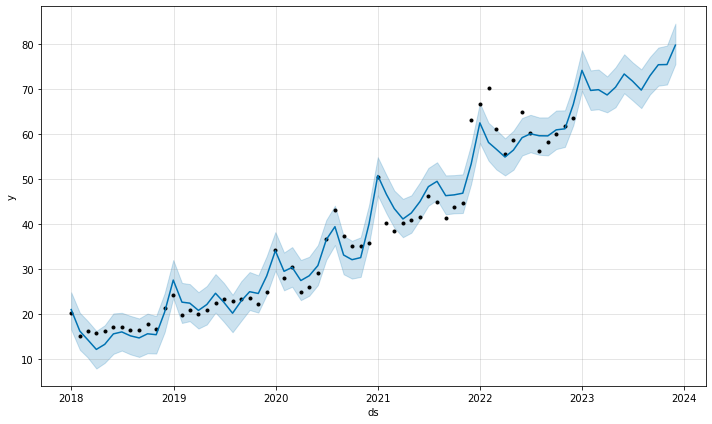

In [121]:
# Now we demonstrate and graph the process for one trend
m = Prophet()

group = groups_by_brand.get_group('Christian Dior-US') 
m.fit(group)

future = m.make_future_dataframe(periods=12, freq='M')  

forecast_Christian_Dior_US = m.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

forecast_Christian_Dior_US['brand'] = group['brand'].iloc[0]

#original data are the black dots, light blue area is the confidence interval, blue line is the forecast model
fig = m.plot(forecast_Christian_Dior_US) 

In [97]:
# Change the type of the column 'ds' in the dataframe 'group' to merge with the 'forecast_Christian_Dior_US' dataframe
group['ds'] = pd.to_datetime(group['ds'])

/var/folders/ck/mkn3qyf97rj2rq0gb3jshzb80000gn/T/ipykernel_22648/1849855932.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [98]:
# Merge the 'group' and 'forecast_Christian_Dior_US' dataframes on the column 'ds'
metric_df = pd.merge(group, forecast_Christian_Dior_US, on='ds')
metric_df.drop(['brand_x', 'yhat_lower', 'yhat_upper', 'brand_y'], axis=1)

,ds,y,yhat
0,2017-12-31,20.4,21.069267
1,2018-01-31,15.25,16.277121
2,2018-02-28,16.25,14.373851
3,2018-03-31,15.75,12.206447
4,2018-04-30,16.4,13.333560
5,2018-05-31,17.25,15.658610
6,2018-06-30,17.25,16.097750
7,2018-07-31,16.6,15.223126
8,2018-08-31,16.5,14.760252
9,2018-09-30,17.8,15.678660


In [99]:
# Calculate the R2 score
r2_score_trend = r2_score(metric_df.y, metric_df.yhat)
r2_score_trend

0.9587912270889528

In [100]:
from math import sqrt

# Calculate the MSE and RMSE between y and yhat
mse = mean_squared_error(metric_df.y, metric_df.yhat)
rmse = sqrt(mse)
mse, rmse

(11.195166187835952, 3.3459178393732194)

### 5.2 Forecast for the clusters

In [101]:
cluster_list = ['cluster0_US','cluster1_US','cluster2_US', 'cluster3_US', 
                'cluster0_FR', 'cluster1_FR', 'cluster2_FR', 'cluster3_FR', 
                'cluster0_JP', 'cluster1_JP', 'cluster2_JP', 'cluster3_JP']

In [102]:
# Change data from the wide format to the long format
df_clusters_forecast = pd.melt(clusters_df, id_vars='date', value_vars=['cluster0_US','cluster1_US','cluster2_US', 'cluster3_US', 
                'cluster0_FR', 'cluster1_FR', 'cluster2_FR', 'cluster3_FR', 
                'cluster0_JP', 'cluster1_JP', 'cluster2_JP', 'cluster3_JP'])
df_clusters_forecast.columns = ['ds', 'cluster', 'y']

In [103]:
print("In total: ", df_clusters_forecast.shape) 
# 12 months (5 years) times 4 clusters times 3 countries (12*5*4*3), in total 720 rows

In total:  (720, 3)


In [104]:
df_clusters_forecast

,ds,cluster,y
0,2017-12-31,cluster0_US,70.491071
1,2018-01-31,cluster0_US,49.592857
2,2018-02-28,cluster0_US,56.292857
3,2018-03-31,cluster0_US,56.650000
4,2018-04-30,cluster0_US,56.650000
...,...,...,...
715,2022-07-31,cluster3_JP,55.725000
716,2022-08-31,cluster3_JP,56.625000
717,2022-09-30,cluster3_JP,59.125000
718,2022-10-31,cluster3_JP,59.800000


In [105]:
# Change 'date' column from object to datetime
df_clusters_forecast['ds'] = pd.to_datetime(df_clusters_forecast['ds'])

In [106]:
# Check the dataset information
df_clusters_forecast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   ds       720 non-null    datetime64[ns]
 1   cluster  720 non-null    object        
 2   y        720 non-null    float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 17.0+ KB


In [107]:
# Group the data by cluster
groups_by_cluster = df_clusters_forecast.groupby('cluster')

In [108]:
# Check the groups in the dataframe
groups_by_cluster.groups.keys()

dict_keys(['cluster0_FR', 'cluster0_JP', 'cluster0_US', 'cluster1_FR', 'cluster1_JP', 'cluster1_US', 'cluster2_FR', 'cluster2_JP', 'cluster2_US', 'cluster3_FR', 'cluster3_JP', 'cluster3_US'])

In [109]:
# Define function for training and forecasting each group
def train_and_forecast_cluster(group):
  # Initiate the model with the default hyperparameters
  m = Prophet()
 
  # Fit the model on the individual time series data
  m.fit(group)

  # Make predictions
  future = m.make_future_dataframe(periods=12, freq='M')  #creates a new dataframe called future for the forecasting, M stands for calendar month end
  forecast = m.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
  forecast['cluster'] = group['cluster'].iloc[0]
 
  # Return the forecasted results
  return forecast[['ds', 'cluster', 'yhat', 'yhat_upper', 'yhat_lower']]

# ds: the datestamp of the forecasted value,
# yhat: the forecasted value of our metric,
# yhat_lower: the lower bound of our forecasts,
# yhat_upper: the upper bound of our forecasts
# When fitting Prophet to monthly data, only make monthly forecasts, which can be done by passing the frequency into make_future_dataframe

In [110]:
# Create an empty dataframe
for_loop_forecast_cluster = pd.DataFrame()

# Loop through each cluster
for cluster in cluster_list:
  # Get the data for the cluster
  group_cluster = groups_by_cluster.get_group(cluster)  
  # Make forecast
  forecast_cluster = train_and_forecast_cluster(group_cluster)
  # Add the forecast results to the dataframe
  for_loop_forecast_cluster = pd.concat((for_loop_forecast_cluster, forecast_cluster))

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to overr

In [111]:
# Take a look at the data (4 trends*3 countries*12 months, we added 144 rows)
for_loop_forecast_cluster

,ds,cluster,yhat,yhat_upper,yhat_lower
0,2017-12-31,cluster0_US,70.705767,75.467951,66.487441
1,2018-01-31,cluster0_US,57.090352,61.722461,52.586569
2,2018-02-28,cluster0_US,57.970563,62.447746,53.280504
3,2018-03-31,cluster0_US,55.445588,59.754004,50.726982
4,2018-04-30,cluster0_US,55.511092,59.933232,50.850280
...,...,...,...,...,...
67,2023-07-31,cluster3_JP,67.785306,74.746133,60.830289
68,2023-08-31,cluster3_JP,71.757835,78.737103,64.633223
69,2023-09-30,cluster3_JP,80.199933,87.321162,72.992689
70,2023-10-31,cluster3_JP,78.408852,85.525525,71.566258


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


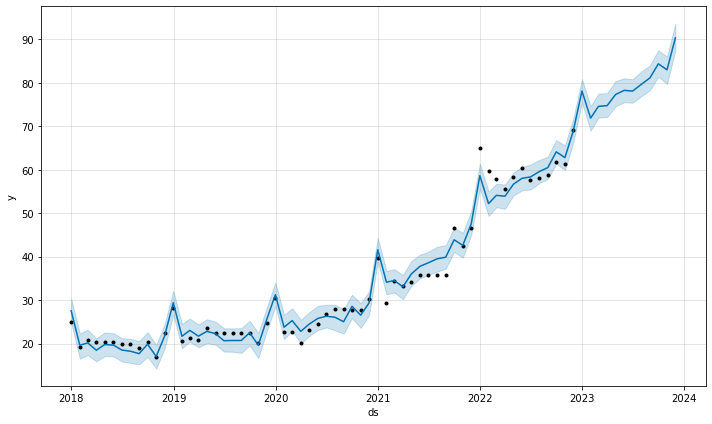

In [112]:
# Now we demonstrate and graph the process for the cluster 3 of the US
m = Prophet()

group_3_US = groups_by_cluster.get_group('cluster3_US') 
m.fit(group_3_US)

future_3_US = m.make_future_dataframe(periods=12, freq='M')  

forecast_3_US = m.predict(future_3_US)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

forecast_3_US['cluster'] = group_3_US['cluster'].iloc[0]

#original data are the black dots, light blue area is the confidence interval, blue line is the forecast model
fig = m.plot(forecast_3_US) 

### 5.3 Evaluation of the forecasting models

In [113]:
group_3_US

,ds,cluster,y
180,2017-12-31,cluster3_US,24.855556
181,2018-01-31,cluster3_US,19.180000
182,2018-02-28,cluster3_US,20.716667
183,2018-03-31,cluster3_US,20.400000
184,2018-04-30,cluster3_US,20.400000
185,2018-05-31,cluster3_US,20.400000
186,2018-06-30,cluster3_US,19.800000
187,2018-07-31,cluster3_US,19.800000
188,2018-08-31,cluster3_US,18.906250
189,2018-09-30,cluster3_US,20.275000


In [114]:
# Change the type of the column 'ds' in the dataframe 'group_3_US' to merge with the 'forecast_3_US' dataframe
group_3_US['ds'] = pd.to_datetime(group_3_US['ds'])

/var/folders/ck/mkn3qyf97rj2rq0gb3jshzb80000gn/T/ipykernel_22648/3107889740.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [115]:
# Merge the 'group_3_US' and 'forecast_3_US' dataframes on the column 'ds'
metric_df_cluster = pd.merge(group_3_US, forecast_3_US, on='ds')
metric_df_cluster = metric_df_cluster.drop(['cluster_x', 'yhat_lower', 'yhat_upper', 'cluster_y'], axis=1)
metric_df_cluster

,ds,y,yhat
0,2017-12-31,24.855556,27.542430
1,2018-01-31,19.180000,19.602926
2,2018-02-28,20.716667,20.161866
3,2018-03-31,20.400000,18.468003
4,2018-04-30,20.400000,19.778217
5,2018-05-31,20.400000,19.652488
6,2018-06-30,19.800000,18.515966
7,2018-07-31,19.800000,18.239866
8,2018-08-31,18.906250,17.680116
9,2018-09-30,20.275000,19.854553


In [116]:
# Calculate the R2 score
r2_score_cluster = r2_score(metric_df_cluster.y, metric_df_cluster.yhat)
r2_score_cluster

0.979224565344572

In [117]:
# Calculate the MSE and RMSE between y and yhat
mse_cluster = mean_squared_error(metric_df_cluster.y, metric_df_cluster.yhat)
rmse_cluster = sqrt(mse_cluster)
mse_cluster, rmse_cluster

(4.730926454501121, 2.1750692987813336)

In [118]:
metrics = np.array([round(r2_score_trend,3), 
                          round(r2_score_cluster,3),
                          round(rmse,3),
                          round(rmse_cluster,3)]) 
metrics = pd.DataFrame(metrics, columns=['Forecasting Metrics'])
metrics.index = ['R2 score for the trend Christian Dior - US', 
                       'R2 score for the cluster 3 of the US',
                       'RMSE for the trend Christian Dior - US',
                       'RMSE for the cluster 3 of the US']
metrics

,Forecasting Metrics
R2 score for the trend Christian Dior - US,0.959
R2 score for the cluster 3 of the US,0.979
RMSE for the trend Christian Dior - US,3.346
RMSE for the cluster 3 of the US,2.175


## Appendix

- We will plot 5 same brands per market with fitted models

1. For Christian Dior in the three markets

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


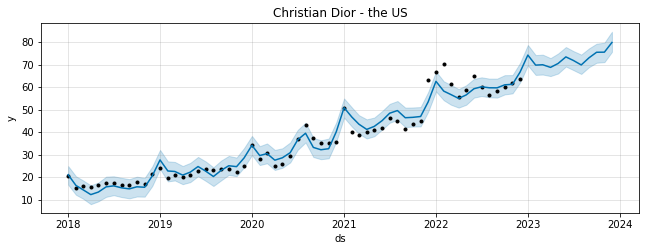

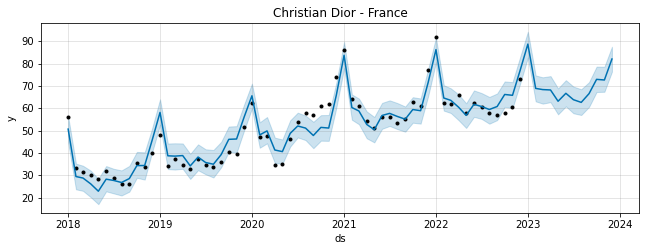

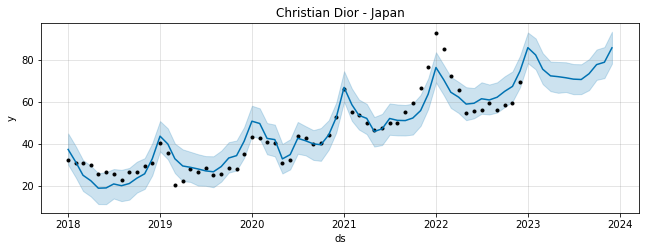

In [122]:
#Forecast for France 
m1 = Prophet()
group = groups_by_brand.get_group('Christian Dior-FR') 
m1.fit(group)
future = m1.make_future_dataframe(periods=12, freq='M')  
forecast_Christian_Dior_FR = m1.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Christian_Dior_FR['brand'] = group['brand'].iloc[0]

#Forecast for Japan
m2 = Prophet()
group = groups_by_brand.get_group('Christian Dior-JP') 
m2.fit(group)
future = m2.make_future_dataframe(periods=12, freq='M')  
forecast_Christian_Dior_JP = m2.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Christian_Dior_JP['brand'] = group['brand'].iloc[0]

#THREE PLOTS. Original data are the black dots, light blue area is the confidence interval, blue line is the forecast model
fig = m.plot(forecast_Christian_Dior_US) 
fig.set_figheight(3)
fig.set_figwidth(9)
plt.title('Christian Dior - the US', fontsize=12)
plt.show()

fig1 = m1.plot(forecast_Christian_Dior_FR) 
fig1.set_figheight(3)
fig1.set_figwidth(9)
plt.title('Christian Dior - France', fontsize=12)
plt.show()

fig2 = m2.plot(forecast_Christian_Dior_JP) 
fig2.set_figheight(3)
fig2.set_figwidth(9)
plt.title('Christian Dior - Japan', fontsize=12)
plt.show()

2. For Sephora in the three markets

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


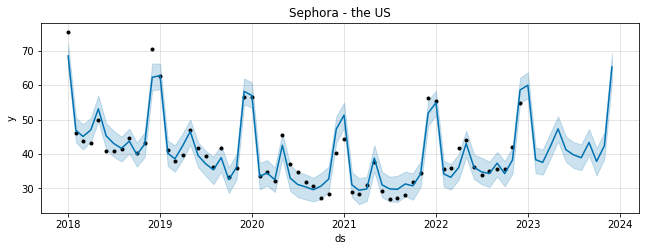

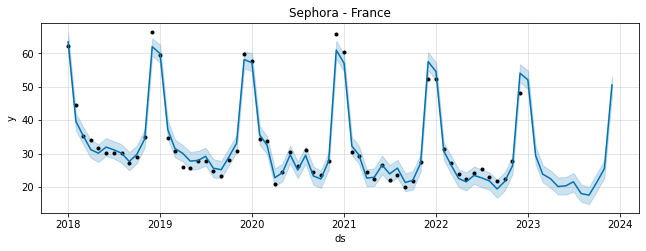

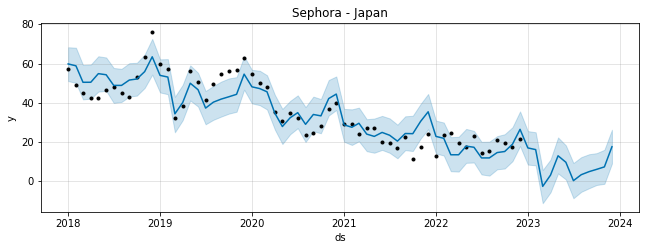

In [123]:
# Forecast for the US
m3 = Prophet()
group = groups_by_brand.get_group('Sephora-US') 
m3.fit(group)
future = m3.make_future_dataframe(periods=12, freq='M')  
forecast_Sephora_US = m3.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Sephora_US['brand'] = group['brand'].iloc[0]

#Forecast for France 
m4 = Prophet()
group = groups_by_brand.get_group('Sephora-FR') 
m4.fit(group)
future = m4.make_future_dataframe(periods=12, freq='M')  
forecast_Sephora_FR = m4.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Sephora_FR['brand'] = group['brand'].iloc[0]

#Forecast for Japan
m5 = Prophet()
group = groups_by_brand.get_group('Sephora-JP') 
m5.fit(group)
future = m5.make_future_dataframe(periods=12, freq='M')  
forecast_Sephora_JP = m5.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Sephora_JP['brand'] = group['brand'].iloc[0]

#THREE PLOTS. Original data are the black dots, light blue area is the confidence interval, blue line is the forecast model
fig3 = m3.plot(forecast_Sephora_US) 
fig3.set_figheight(3)
fig3.set_figwidth(9)
plt.title('Sephora - the US', fontsize=12)
plt.show()

fig4 = m4.plot(forecast_Sephora_FR) 
fig4.set_figheight(3)
fig4.set_figwidth(9)
plt.title('Sephora - France', fontsize=12)
plt.show()

fig5 = m5.plot(forecast_Sephora_JP) 
fig5.set_figheight(3)
fig5.set_figwidth(9)
plt.title('Sephora - Japan', fontsize=12)
plt.show()

3. For Louis Vuitton in the three markets

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


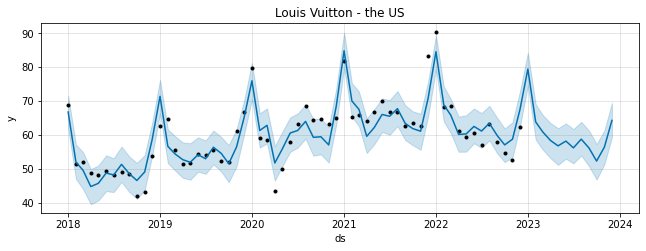

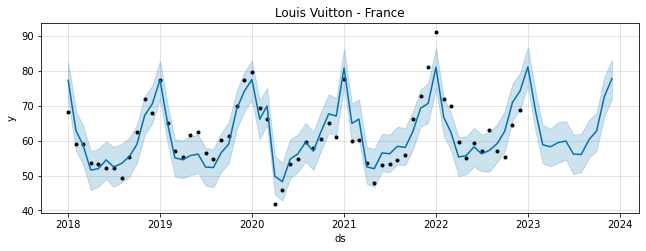

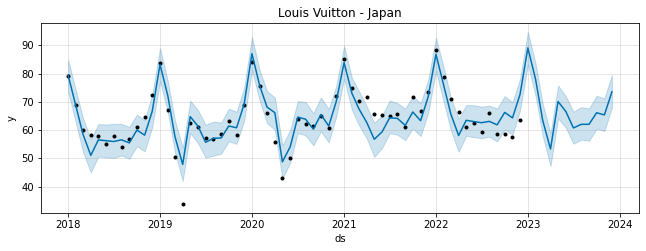

In [124]:
# Forecast for the US
m6 = Prophet()
group = groups_by_brand.get_group('Louis Vuitton-US') 
m6.fit(group)
future = m6.make_future_dataframe(periods=12, freq='M')  
forecast_Louis_Vuitton_US = m6.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Louis_Vuitton_US['brand'] = group['brand'].iloc[0]

#Forecast for France 
m7 = Prophet()
group = groups_by_brand.get_group('Louis Vuitton-FR') 
m7.fit(group)
future = m7.make_future_dataframe(periods=12, freq='M')  
forecast_Louis_Vuitton_FR = m7.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Louis_Vuitton_FR['brand'] = group['brand'].iloc[0]

#Forecast for Japan
m8 = Prophet()
group = groups_by_brand.get_group('Louis Vuitton-JP') 
m8.fit(group)
future = m8.make_future_dataframe(periods=12, freq='M')  
forecast_Louis_Vuitton_JP = m8.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Louis_Vuitton_JP['brand'] = group['brand'].iloc[0]

#THREE PLOTS. Original data are the black dots, light blue area is the confidence interval, blue line is the forecast model
fig6 = m6.plot(forecast_Louis_Vuitton_US) 
fig6.set_figheight(3)
fig6.set_figwidth(9)
plt.title('Louis Vuitton - the US', fontsize=12)
plt.show()

fig7 = m7.plot(forecast_Louis_Vuitton_FR) 
fig7.set_figheight(3)
fig7.set_figwidth(9)
plt.title('Louis Vuitton - France', fontsize=12)
plt.show()

fig8 = m8.plot(forecast_Louis_Vuitton_JP) 
fig8.set_figheight(3)
fig8.set_figwidth(9)
plt.title('Louis Vuitton - Japan', fontsize=12)
plt.show()

4. For Kenzo in the three markets

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


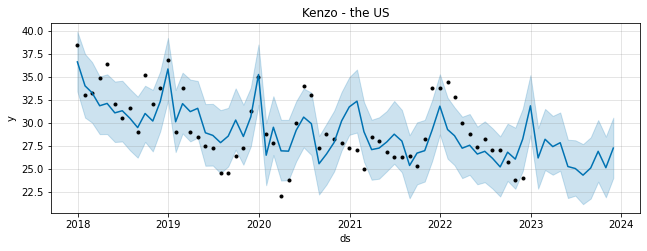

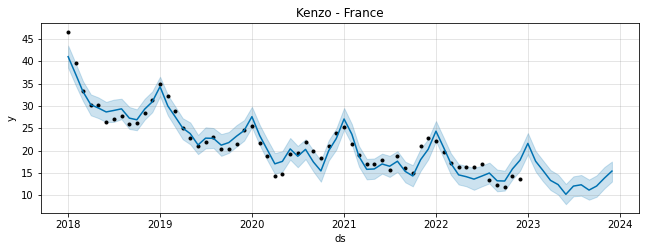

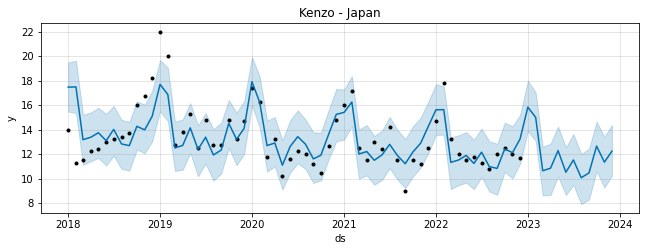

In [125]:
# Forecast for the US
m9 = Prophet()
group = groups_by_brand.get_group('Kenzo-US') 
m9.fit(group)
future = m9.make_future_dataframe(periods=12, freq='M')  
forecast_Kenzo_US = m9.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Kenzo_US['brand'] = group['brand'].iloc[0]

#Forecast for France 
m10 = Prophet()
group = groups_by_brand.get_group('Kenzo-FR') 
m10.fit(group)
future = m10.make_future_dataframe(periods=12, freq='M')  
forecast_Kenzo_FR = m10.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Kenzo_FR['brand'] = group['brand'].iloc[0]

#Forecast for Japan
m11 = Prophet()
group = groups_by_brand.get_group('Kenzo-JP') 
m11.fit(group)
future = m11.make_future_dataframe(periods=12, freq='M')  
forecast_Kenzo_JP = m11.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Kenzo_JP['brand'] = group['brand'].iloc[0]

#THREE PLOTS. Original data are the black dots, light blue area is the confidence interval, blue line is the forecast model
fig9 = m9.plot(forecast_Kenzo_US) 
fig9.set_figheight(3)
fig9.set_figwidth(9)
plt.title('Kenzo - the US', fontsize=12)
plt.show()

fig10 = m10.plot(forecast_Kenzo_FR) 
fig10.set_figheight(3)
fig10.set_figwidth(9)
plt.title('Kenzo - France', fontsize=12)
plt.show()

fig11 = m11.plot(forecast_Kenzo_JP) 
fig11.set_figheight(3)
fig11.set_figwidth(9)
plt.title('Kenzo - Japan', fontsize=12)
plt.show()

5. For Hennessy in the three markets

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


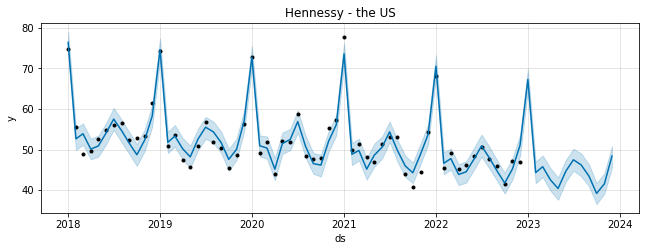

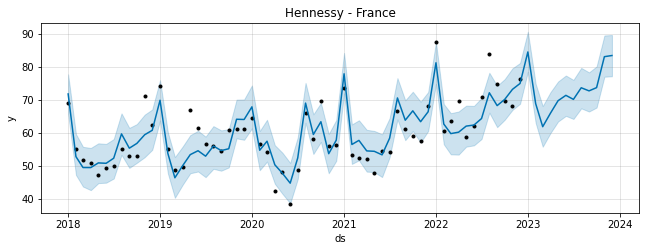

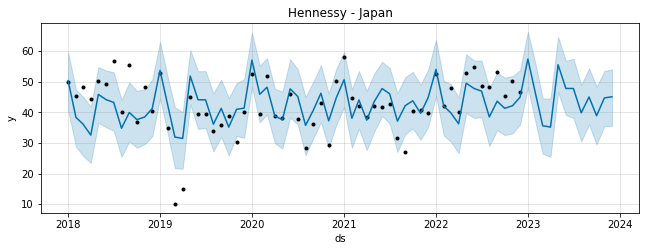

In [126]:
# Forecast for the US
m12 = Prophet()
group = groups_by_brand.get_group('Hennessy-US') 
m12.fit(group)
future = m12.make_future_dataframe(periods=12, freq='M')  
forecast_Hennessy_US = m12.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Hennessy_US['brand'] = group['brand'].iloc[0]

#Forecast for France 
m13 = Prophet()
group = groups_by_brand.get_group('Hennessy-FR') 
m13.fit(group)
future = m13.make_future_dataframe(periods=12, freq='M')  
forecast_Hennessy_FR = m13.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Hennessy_FR['brand'] = group['brand'].iloc[0]

#Forecast for Japan
m14 = Prophet()
group = groups_by_brand.get_group('Hennessy-JP') 
m14.fit(group)
future = m14.make_future_dataframe(periods=12, freq='M')  
forecast_Hennessy_JP = m14.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_Hennessy_JP['brand'] = group['brand'].iloc[0]

#THREE PLOTS. Original data are the black dots, light blue area is the confidence interval, blue line is the forecast model
fig12 = m12.plot(forecast_Hennessy_US) 
fig12.set_figheight(3)
fig12.set_figwidth(9)
plt.title('Hennessy - the US', fontsize=12)
plt.show()

fig13 = m13.plot(forecast_Hennessy_FR) 
fig13.set_figheight(3)
fig13.set_figwidth(9)
plt.title('Hennessy - France', fontsize=12)
plt.show()

fig14 = m14.plot(forecast_Hennessy_JP) 
fig14.set_figheight(3)
fig14.set_figwidth(9)
plt.title('Hennessy - Japan', fontsize=12)
plt.show()

# References

- https://towardsdatascience.com/a-very-precise-fast-way-to-pull-google-trends-data-automatically-4c3c431960aa
- https://github.com/facebookresearch/Kats/blob/main/tutorials/kats_101_basics.ipynb
- https://medium.com/swlh/k-means-clustering-in-python-6c2d7ea01af1
- https://www.kaggle.com/code/izzettunc/introduction-to-time-series-clustering/notebook
- https://stackoverflow.com/questions/69191490/dendrogram-analysis-of-hierarchical-clustering-algorithm
- https://wellsr.com/python/python-agglomerative-clustering-with-sklearn/
- https://www.python-graph-gallery.com/401-customised-dendrogram
- https://numpy.org/doc/stable/reference/generated/numpy.column_stack.html
- https://medium.com/grabngoinfo/3-ways-for-multiple-time-series-forecasting-using-prophet-in-python-7a0709a117f9